# 人脸生成（Face Generation）
在该项目中，你将使用生成式对抗网络（Generative Adversarial Nets）来生成新的人脸图像。
### 获取数据
该项目将使用以下数据集：
- MNIST
- CelebA

由于 CelebA 数据集比较复杂，而且这是你第一次使用 GANs。我们想让你先在 MNIST 数据集上测试你的 GANs 模型，以让你更快的评估所建立模型的性能。

如果你在使用 [FloydHub](https://www.floydhub.com/), 请将 `data_dir` 设置为 "/input" 并使用 [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [20]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## 探索数据（Explore the Data）
### MNIST
[MNIST](http://yann.lecun.com/exdb/mnist/) 是一个手写数字的图像数据集。你可以更改 `show_n_images` 探索此数据集。

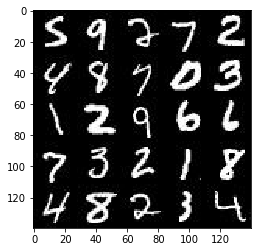

In [21]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
[CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) 是一个包含 20 多万张名人图片及相关图片说明的数据集。你将用此数据集生成人脸，不会用不到相关说明。你可以更改 `show_n_images` 探索此数据集。

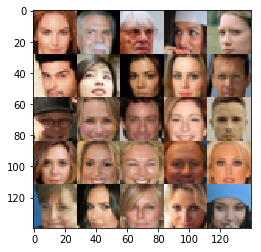

In [22]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## 预处理数据（Preprocess the Data）
由于该项目的重点是建立 GANs 模型，我们将为你预处理数据。

经过数据预处理，MNIST 和 CelebA 数据集的值在 28×28 维度图像的 [-0.5, 0.5] 范围内。CelebA 数据集中的图像裁剪了非脸部的图像部分，然后调整到 28x28 维度。

MNIST 数据集中的图像是单[通道](https://en.wikipedia.org/wiki/Channel_(digital_image%29)的黑白图像，CelebA 数据集中的图像是 [三通道的 RGB 彩色图像](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images)。

## 建立神经网络（Build the Neural Network）
你将通过部署以下函数来建立 GANs 的主要组成部分:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### 检查 TensorFlow 版本并获取 GPU 型号
检查你是否使用正确的 TensorFlow 版本，并获取 GPU 型号

In [23]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### 输入（Input）
部署 `model_inputs` 函数以创建用于神经网络的 [占位符 (TF Placeholders)](https://www.tensorflow.org/versions/r0.11/api_docs/python/io_ops/placeholders)。请创建以下占位符：
- 输入图像占位符: 使用 `image_width`，`image_height` 和 `image_channels` 设置为 rank 4。
- 输入 Z 占位符: 设置为 rank 2，并命名为 `z_dim`。
- 学习速率占位符: 设置为 rank 0。

返回占位符元组的形状为 (tensor of real input images, tensor of z data, learning rate)。


In [24]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real = tf.placeholder(tf.float32,(None,image_height,image_width,image_channels),name="input_real")
    input_z = tf.placeholder(tf.float32,(None,z_dim),name="input_z")
    learning_rate_pl =tf.placeholder(tf.float32,name="learning_rate")
    return input_real,input_z,learning_rate_pl


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### 辨别器（Discriminator）
部署 `discriminator` 函数创建辨别器神经网络以辨别 `images`。该函数应能够重复使用神经网络中的各种变量。 在 [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) 中使用 "discriminator" 的变量空间名来重复使用该函数中的变量。 

该函数应返回形如 (tensor output of the discriminator, tensor logits of the discriminator) 的元组。

In [25]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    alpha = 0.20
    with tf.variable_scope("discriminator", reuse=reuse):
        conv1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        conv1 = tf.maximum(alpha * conv1, conv1)
        
        conv2 = tf.layers.conv2d(conv1, 128, 5, strides=2, padding='same')
        conv2 = tf.layers.batch_normalization(conv2,  training=True)
        conv2 = tf.maximum(alpha * conv2, conv2)
        
        conv3 = tf.layers.conv2d(conv2, 256, 5, strides=2, padding='same')
        conv3 = tf.layers.batch_normalization(conv3,  training=True)
        conv3 = tf.maximum(alpha * conv3, conv3)

        flat  = tf.reshape(conv3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### 生成器（Generator）
部署 `generator` 函数以使用 `z` 生成图像。该函数应能够重复使用神经网络中的各种变量。
在 [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) 中使用 "generator" 的变量空间名来重复使用该函数中的变量。 

该函数应返回所生成的 28 x 28 x `out_channel_dim` 维度图像。

In [26]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha = 0.1
    with tf.variable_scope("generator", reuse=not is_train):
        x = tf.layers.dense(z, 7*7*512)
        x = tf.reshape(x, (-1, 7, 7, 512))
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.maximum(alpha * x, x)
        
        conv1 = tf.layers.conv2d_transpose(x, 256, 5, strides=1, padding="same")
        conv1 = tf.layers.batch_normalization(conv1, training=is_train)
        conv1 = tf.maximum(alpha * conv1, conv1)
        
        conv2 = tf.layers.conv2d_transpose(conv1, 128, 5, strides=2, padding="same")
        conv2 = tf.layers.batch_normalization(conv2, training=is_train)
        conv2 = tf.maximum(alpha * conv2, conv2)
        
        logits = tf.layers.conv2d_transpose(conv2, out_channel_dim, 5, strides=2, padding="same")
        out = tf.tanh(logits)
    
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### 损失函数（Loss）
部署 `model_loss` 函数训练并计算 GANs 的损失。该函数应返回形如 (discriminator loss, generator loss) 的元组。

使用你已实现的函数：
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [27]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    gen_model = generator(input_z,out_channel_dim,is_train=True)
    
    d_model_real,d_logits_real =discriminator(input_real,reuse=False)
    d_model_fake,d_logits_fake =discriminator(gen_model,reuse=True)
    
    d_loss_real = tf.reduce_mean(
                  tf.nn.sigmoid_cross_entropy_with_logits(
                  logits=d_logits_real, labels=tf.ones_like(d_model_real)*0.9))
    d_loss_fake = tf.reduce_mean(
                  tf.nn.sigmoid_cross_entropy_with_logits(
                  logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
             tf.nn.sigmoid_cross_entropy_with_logits(
             logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### 优化（Optimization）
部署 `model_opt` 函数实现对 GANs 的优化。使用 [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) 获取可训练的所有变量。通过变量空间名 `discriminator` 和 `generator` 来过滤变量。该函数应返回形如 (discriminator training operation, generator training operation) 的元组。

In [28]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    train_vars = tf.trainable_variables()
    d_vars = [var for var in train_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in train_vars if var.name.startswith('generator')]
    
    d_train_opt = tf.train.AdamOptimizer(
                  learning_rate, beta1=beta1).minimize(
                  d_loss, var_list=d_vars)
    with tf.control_dependencies(
         tf.get_collection(tf.GraphKeys.UPDATE_OPS)): 
        g_train_opt = tf.train.AdamOptimizer(
                      learning_rate, beta1=beta1).minimize(
                      g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## 训练神经网络（Neural Network Training）
### 输出显示
使用该函数可以显示生成器 (Generator) 在训练过程中的当前输出，这会帮你评估 GANs 模型的训练程度。

In [29]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### 训练
部署 `train` 函数以建立并训练 GANs 模型。记得使用以下你已完成的函数：
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

使用 `show_generator_output` 函数显示 `generator` 在训练过程中的输出。

**注意**：在每个批次 (batch) 中运行 `show_generator_output` 函数会显著增加训练时间与该 notebook 的体积。推荐每 100 批次输出一次 `generator` 的输出。 

In [30]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    n_samples, width, height, channels = data_shape
    input_real, input_z, learn_rate = model_inputs(width, height, channels, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, channels)
    d_opt, g_opt = model_opt(d_loss, g_loss, learn_rate, beta1)
    
    steps = 0
    show_every = 50
    print_every = 10
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, learn_rate: learning_rate})
                _ = sess.run(g_opt, feed_dict={input_real: batch_images, input_z: batch_z, learn_rate: learning_rate})

                if steps % show_every == 0:
                    n_images = 16
                    show_generator_output(sess, n_images, input_z, channels, data_image_mode)

                if steps % print_every == 0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                

### MNIST
在 MNIST 上测试你的 GANs 模型。经过 2 次迭代，GANs 应该能够生成类似手写数字的图像。确保生成器 (generator) 低于辨别器 (discriminator) 的损失，或接近 0。

Epoch 0/2... Discriminator Loss: 5.7157... Generator Loss: 0.0785
Epoch 0/2... Discriminator Loss: 2.8270... Generator Loss: 0.2087
Epoch 0/2... Discriminator Loss: 1.4256... Generator Loss: 2.2397
Epoch 0/2... Discriminator Loss: 5.3027... Generator Loss: 8.4098


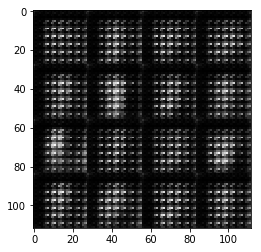

Epoch 0/2... Discriminator Loss: 2.4377... Generator Loss: 3.9952
Epoch 0/2... Discriminator Loss: 1.4412... Generator Loss: 0.7546
Epoch 0/2... Discriminator Loss: 1.3459... Generator Loss: 0.7294
Epoch 0/2... Discriminator Loss: 2.2959... Generator Loss: 0.3287
Epoch 0/2... Discriminator Loss: 0.8890... Generator Loss: 1.9607


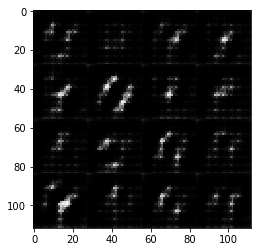

Epoch 0/2... Discriminator Loss: 1.4761... Generator Loss: 0.4776
Epoch 0/2... Discriminator Loss: 2.6697... Generator Loss: 5.3609
Epoch 0/2... Discriminator Loss: 0.6628... Generator Loss: 2.0077
Epoch 0/2... Discriminator Loss: 0.4293... Generator Loss: 2.6301
Epoch 0/2... Discriminator Loss: 1.3382... Generator Loss: 0.6488


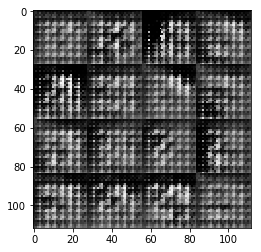

Epoch 0/2... Discriminator Loss: 0.4120... Generator Loss: 3.1048
Epoch 0/2... Discriminator Loss: 0.8302... Generator Loss: 2.8915
Epoch 0/2... Discriminator Loss: 0.4004... Generator Loss: 3.6325
Epoch 0/2... Discriminator Loss: 0.4216... Generator Loss: 3.0246
Epoch 0/2... Discriminator Loss: 0.4640... Generator Loss: 3.6685


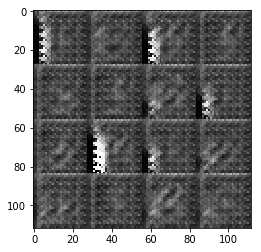

Epoch 0/2... Discriminator Loss: 0.4504... Generator Loss: 2.4650
Epoch 0/2... Discriminator Loss: 0.4567... Generator Loss: 2.6295
Epoch 0/2... Discriminator Loss: 0.4322... Generator Loss: 4.5677
Epoch 0/2... Discriminator Loss: 0.4448... Generator Loss: 3.7739
Epoch 0/2... Discriminator Loss: 2.0283... Generator Loss: 0.2442


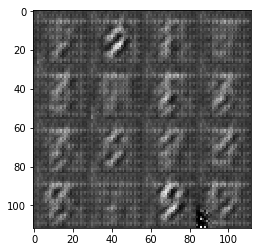

Epoch 0/2... Discriminator Loss: 2.0286... Generator Loss: 0.3225
Epoch 0/2... Discriminator Loss: 2.1480... Generator Loss: 0.2760
Epoch 0/2... Discriminator Loss: 2.3812... Generator Loss: 8.7434
Epoch 0/2... Discriminator Loss: 1.3304... Generator Loss: 0.9010
Epoch 0/2... Discriminator Loss: 0.6641... Generator Loss: 2.3616


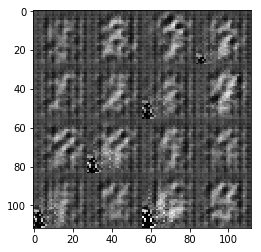

Epoch 0/2... Discriminator Loss: 0.7693... Generator Loss: 1.7926
Epoch 0/2... Discriminator Loss: 1.0610... Generator Loss: 0.8608
Epoch 0/2... Discriminator Loss: 0.9086... Generator Loss: 1.3821
Epoch 0/2... Discriminator Loss: 0.3955... Generator Loss: 3.7801
Epoch 0/2... Discriminator Loss: 0.3917... Generator Loss: 4.2071


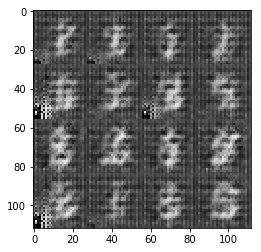

Epoch 0/2... Discriminator Loss: 0.3414... Generator Loss: 9.3358
Epoch 0/2... Discriminator Loss: 0.9794... Generator Loss: 5.4332
Epoch 0/2... Discriminator Loss: 0.6542... Generator Loss: 3.9272
Epoch 0/2... Discriminator Loss: 0.5529... Generator Loss: 2.1984
Epoch 0/2... Discriminator Loss: 0.3980... Generator Loss: 6.8792


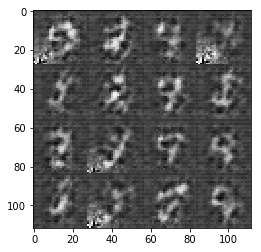

Epoch 0/2... Discriminator Loss: 0.5779... Generator Loss: 2.8355
Epoch 0/2... Discriminator Loss: 0.8770... Generator Loss: 2.8887
Epoch 0/2... Discriminator Loss: 1.5572... Generator Loss: 0.6530
Epoch 0/2... Discriminator Loss: 1.0592... Generator Loss: 0.8080
Epoch 0/2... Discriminator Loss: 1.3049... Generator Loss: 0.6279


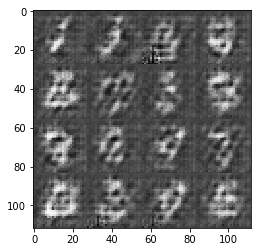

Epoch 0/2... Discriminator Loss: 0.8773... Generator Loss: 1.7450
Epoch 0/2... Discriminator Loss: 2.1104... Generator Loss: 0.2325
Epoch 0/2... Discriminator Loss: 1.1083... Generator Loss: 0.9451
Epoch 0/2... Discriminator Loss: 0.7976... Generator Loss: 1.2231
Epoch 0/2... Discriminator Loss: 0.9204... Generator Loss: 1.4458


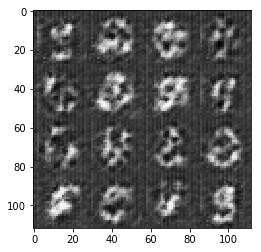

Epoch 0/2... Discriminator Loss: 0.8010... Generator Loss: 1.4781
Epoch 0/2... Discriminator Loss: 0.9833... Generator Loss: 2.5697
Epoch 0/2... Discriminator Loss: 1.0000... Generator Loss: 0.9484
Epoch 0/2... Discriminator Loss: 3.1921... Generator Loss: 0.0993
Epoch 0/2... Discriminator Loss: 0.6080... Generator Loss: 1.9420


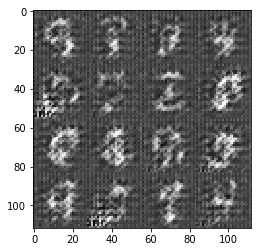

Epoch 0/2... Discriminator Loss: 0.7472... Generator Loss: 1.1888
Epoch 0/2... Discriminator Loss: 0.3995... Generator Loss: 4.8652
Epoch 0/2... Discriminator Loss: 1.2772... Generator Loss: 3.3348
Epoch 0/2... Discriminator Loss: 1.9482... Generator Loss: 0.2826
Epoch 0/2... Discriminator Loss: 1.0605... Generator Loss: 0.7210


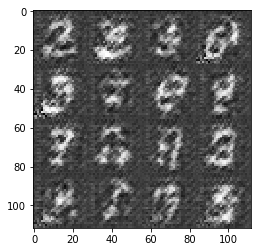

Epoch 0/2... Discriminator Loss: 0.7803... Generator Loss: 1.3098
Epoch 0/2... Discriminator Loss: 1.5960... Generator Loss: 2.8918
Epoch 0/2... Discriminator Loss: 1.2081... Generator Loss: 0.6348
Epoch 0/2... Discriminator Loss: 0.9555... Generator Loss: 1.5544
Epoch 0/2... Discriminator Loss: 1.9892... Generator Loss: 2.7389


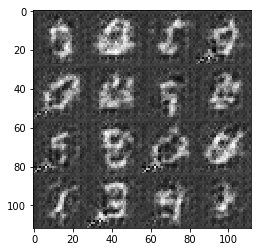

Epoch 0/2... Discriminator Loss: 0.9144... Generator Loss: 1.7270
Epoch 0/2... Discriminator Loss: 0.3948... Generator Loss: 3.3284
Epoch 0/2... Discriminator Loss: 0.5258... Generator Loss: 2.6341
Epoch 0/2... Discriminator Loss: 0.6866... Generator Loss: 1.8999
Epoch 0/2... Discriminator Loss: 0.7281... Generator Loss: 2.8141


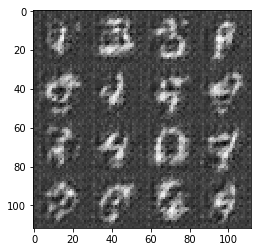

Epoch 0/2... Discriminator Loss: 0.5096... Generator Loss: 2.7240
Epoch 0/2... Discriminator Loss: 0.7587... Generator Loss: 1.2106
Epoch 0/2... Discriminator Loss: 1.8584... Generator Loss: 2.1246
Epoch 0/2... Discriminator Loss: 0.6449... Generator Loss: 1.8007
Epoch 0/2... Discriminator Loss: 0.5422... Generator Loss: 2.0425


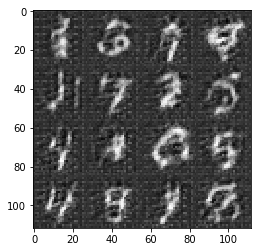

Epoch 0/2... Discriminator Loss: 1.1301... Generator Loss: 0.7717
Epoch 0/2... Discriminator Loss: 0.8866... Generator Loss: 1.8047
Epoch 0/2... Discriminator Loss: 0.5281... Generator Loss: 3.5796
Epoch 0/2... Discriminator Loss: 0.4046... Generator Loss: 4.4421
Epoch 0/2... Discriminator Loss: 0.4111... Generator Loss: 4.8284


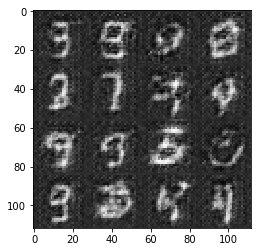

Epoch 0/2... Discriminator Loss: 0.7954... Generator Loss: 1.4849
Epoch 0/2... Discriminator Loss: 0.4733... Generator Loss: 2.4018
Epoch 0/2... Discriminator Loss: 0.3906... Generator Loss: 4.2327
Epoch 0/2... Discriminator Loss: 3.3425... Generator Loss: 0.1193
Epoch 0/2... Discriminator Loss: 1.2883... Generator Loss: 2.7050


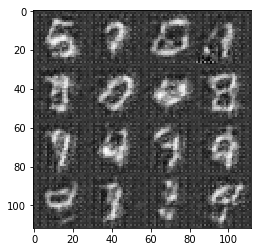

Epoch 0/2... Discriminator Loss: 0.8242... Generator Loss: 1.2130
Epoch 0/2... Discriminator Loss: 1.3014... Generator Loss: 0.7641
Epoch 0/2... Discriminator Loss: 0.6486... Generator Loss: 2.2428
Epoch 0/2... Discriminator Loss: 0.9269... Generator Loss: 1.0451
Epoch 0/2... Discriminator Loss: 3.2105... Generator Loss: 5.1123


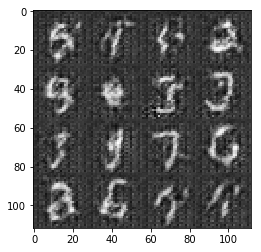

Epoch 0/2... Discriminator Loss: 1.2767... Generator Loss: 0.6133
Epoch 0/2... Discriminator Loss: 0.9472... Generator Loss: 1.3362
Epoch 0/2... Discriminator Loss: 1.0728... Generator Loss: 0.8817
Epoch 0/2... Discriminator Loss: 1.6388... Generator Loss: 0.4282
Epoch 0/2... Discriminator Loss: 0.4748... Generator Loss: 2.5407


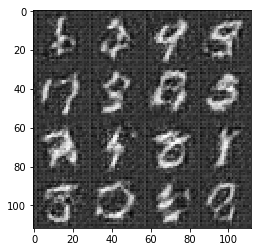

Epoch 0/2... Discriminator Loss: 0.6100... Generator Loss: 1.6499
Epoch 0/2... Discriminator Loss: 0.4768... Generator Loss: 2.5669
Epoch 0/2... Discriminator Loss: 0.5892... Generator Loss: 1.7444
Epoch 0/2... Discriminator Loss: 0.4774... Generator Loss: 2.2588
Epoch 0/2... Discriminator Loss: 0.8270... Generator Loss: 1.5077


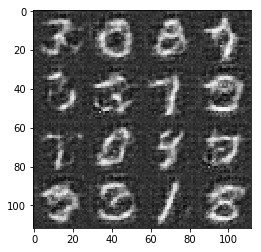

Epoch 0/2... Discriminator Loss: 0.8924... Generator Loss: 1.7341
Epoch 0/2... Discriminator Loss: 1.0311... Generator Loss: 2.0249
Epoch 0/2... Discriminator Loss: 0.8526... Generator Loss: 1.4296
Epoch 0/2... Discriminator Loss: 1.4036... Generator Loss: 3.6220
Epoch 0/2... Discriminator Loss: 0.7438... Generator Loss: 1.9750


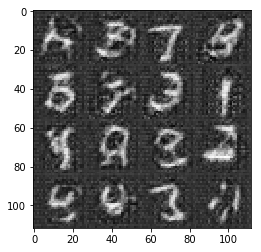

Epoch 0/2... Discriminator Loss: 0.6987... Generator Loss: 1.3336
Epoch 0/2... Discriminator Loss: 0.3942... Generator Loss: 3.2036
Epoch 0/2... Discriminator Loss: 0.4548... Generator Loss: 2.5700
Epoch 0/2... Discriminator Loss: 0.4004... Generator Loss: 3.3381
Epoch 0/2... Discriminator Loss: 0.5125... Generator Loss: 2.4470


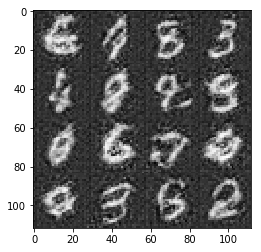

Epoch 0/2... Discriminator Loss: 0.5050... Generator Loss: 2.0929
Epoch 0/2... Discriminator Loss: 0.4485... Generator Loss: 2.5011
Epoch 0/2... Discriminator Loss: 0.3874... Generator Loss: 3.2980
Epoch 0/2... Discriminator Loss: 0.3673... Generator Loss: 3.5583
Epoch 0/2... Discriminator Loss: 0.3582... Generator Loss: 4.0459


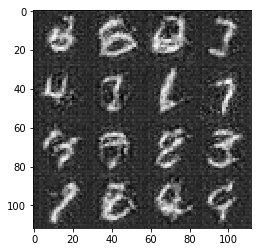

Epoch 0/2... Discriminator Loss: 0.5990... Generator Loss: 1.6444
Epoch 0/2... Discriminator Loss: 0.3713... Generator Loss: 3.7664
Epoch 0/2... Discriminator Loss: 0.3440... Generator Loss: 5.5658
Epoch 0/2... Discriminator Loss: 0.3522... Generator Loss: 4.9981
Epoch 0/2... Discriminator Loss: 0.5502... Generator Loss: 2.3992


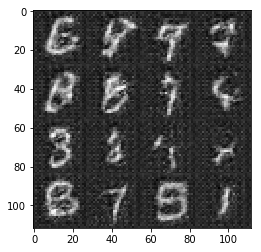

Epoch 0/2... Discriminator Loss: 1.1322... Generator Loss: 0.8449
Epoch 0/2... Discriminator Loss: 0.9225... Generator Loss: 2.6164
Epoch 0/2... Discriminator Loss: 0.5732... Generator Loss: 1.8954
Epoch 0/2... Discriminator Loss: 0.4102... Generator Loss: 2.8348
Epoch 0/2... Discriminator Loss: 0.4085... Generator Loss: 2.8218


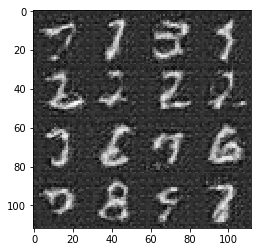

Epoch 0/2... Discriminator Loss: 0.8257... Generator Loss: 1.3937
Epoch 0/2... Discriminator Loss: 0.7854... Generator Loss: 2.9001
Epoch 0/2... Discriminator Loss: 1.3345... Generator Loss: 0.6141
Epoch 0/2... Discriminator Loss: 0.4500... Generator Loss: 3.1715
Epoch 0/2... Discriminator Loss: 0.7829... Generator Loss: 2.5481


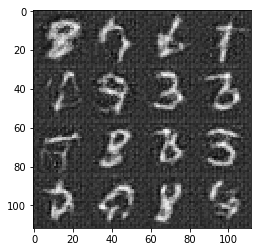

Epoch 0/2... Discriminator Loss: 1.3604... Generator Loss: 2.3070
Epoch 0/2... Discriminator Loss: 1.0556... Generator Loss: 0.9646
Epoch 0/2... Discriminator Loss: 1.3086... Generator Loss: 0.6977
Epoch 0/2... Discriminator Loss: 0.9645... Generator Loss: 1.0275
Epoch 0/2... Discriminator Loss: 0.5286... Generator Loss: 2.5639


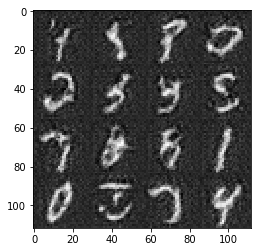

Epoch 0/2... Discriminator Loss: 0.5534... Generator Loss: 1.9192
Epoch 0/2... Discriminator Loss: 0.3646... Generator Loss: 3.8383
Epoch 0/2... Discriminator Loss: 0.4648... Generator Loss: 2.2849
Epoch 0/2... Discriminator Loss: 0.3571... Generator Loss: 4.1728
Epoch 0/2... Discriminator Loss: 0.3560... Generator Loss: 4.8980


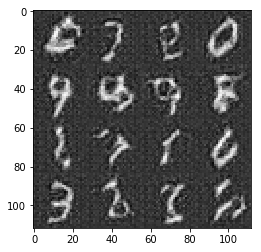

Epoch 0/2... Discriminator Loss: 0.3734... Generator Loss: 4.0803
Epoch 0/2... Discriminator Loss: 0.5391... Generator Loss: 1.9263
Epoch 0/2... Discriminator Loss: 0.7183... Generator Loss: 2.2666
Epoch 0/2... Discriminator Loss: 0.7447... Generator Loss: 1.7786
Epoch 0/2... Discriminator Loss: 0.4578... Generator Loss: 2.5313


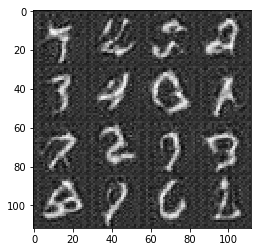

Epoch 0/2... Discriminator Loss: 0.9151... Generator Loss: 1.3811
Epoch 0/2... Discriminator Loss: 0.8129... Generator Loss: 2.8090
Epoch 0/2... Discriminator Loss: 1.2621... Generator Loss: 3.8804
Epoch 0/2... Discriminator Loss: 1.3439... Generator Loss: 0.6620
Epoch 0/2... Discriminator Loss: 0.4778... Generator Loss: 2.5336


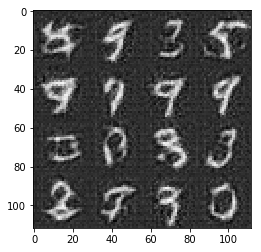

Epoch 0/2... Discriminator Loss: 0.4361... Generator Loss: 2.7806
Epoch 0/2... Discriminator Loss: 0.4379... Generator Loss: 2.6761
Epoch 0/2... Discriminator Loss: 1.1973... Generator Loss: 0.8941
Epoch 0/2... Discriminator Loss: 0.5316... Generator Loss: 2.6362
Epoch 0/2... Discriminator Loss: 2.7649... Generator Loss: 0.2020


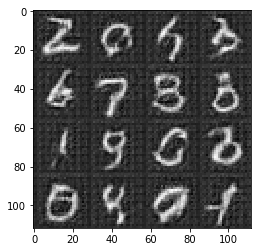

Epoch 0/2... Discriminator Loss: 0.7838... Generator Loss: 1.5452
Epoch 0/2... Discriminator Loss: 1.1472... Generator Loss: 0.8570
Epoch 0/2... Discriminator Loss: 0.9426... Generator Loss: 0.9106
Epoch 0/2... Discriminator Loss: 0.4583... Generator Loss: 2.6842
Epoch 0/2... Discriminator Loss: 0.3857... Generator Loss: 3.7341


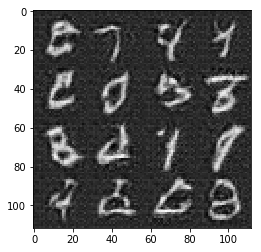

Epoch 0/2... Discriminator Loss: 0.4098... Generator Loss: 4.6134
Epoch 0/2... Discriminator Loss: 0.3681... Generator Loss: 4.6978
Epoch 0/2... Discriminator Loss: 0.5642... Generator Loss: 1.8494
Epoch 0/2... Discriminator Loss: 0.3637... Generator Loss: 4.1705
Epoch 0/2... Discriminator Loss: 0.3931... Generator Loss: 3.0954


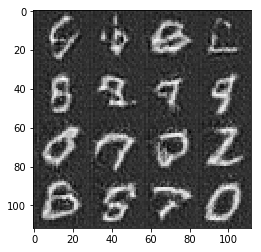

Epoch 0/2... Discriminator Loss: 0.4277... Generator Loss: 3.4860
Epoch 0/2... Discriminator Loss: 1.1574... Generator Loss: 2.3862
Epoch 0/2... Discriminator Loss: 0.6492... Generator Loss: 2.3941
Epoch 0/2... Discriminator Loss: 0.5611... Generator Loss: 1.9847
Epoch 0/2... Discriminator Loss: 0.5175... Generator Loss: 2.4041


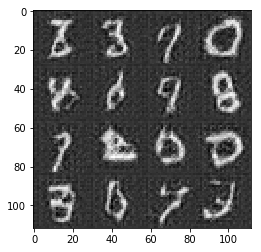

Epoch 0/2... Discriminator Loss: 0.4551... Generator Loss: 3.3884
Epoch 0/2... Discriminator Loss: 0.4736... Generator Loss: 2.3271
Epoch 0/2... Discriminator Loss: 1.0655... Generator Loss: 1.3950
Epoch 0/2... Discriminator Loss: 0.7594... Generator Loss: 1.8898
Epoch 0/2... Discriminator Loss: 0.6437... Generator Loss: 1.5804


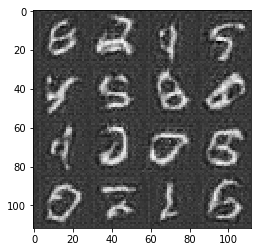

Epoch 0/2... Discriminator Loss: 0.5210... Generator Loss: 1.9422
Epoch 0/2... Discriminator Loss: 0.4131... Generator Loss: 2.8902
Epoch 0/2... Discriminator Loss: 0.3471... Generator Loss: 5.2674
Epoch 0/2... Discriminator Loss: 0.3553... Generator Loss: 5.6438
Epoch 0/2... Discriminator Loss: 2.7093... Generator Loss: 0.1599


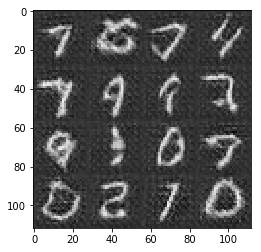

Epoch 0/2... Discriminator Loss: 0.8604... Generator Loss: 2.5015
Epoch 0/2... Discriminator Loss: 0.7905... Generator Loss: 2.1221
Epoch 0/2... Discriminator Loss: 0.8631... Generator Loss: 1.0309
Epoch 0/2... Discriminator Loss: 0.5104... Generator Loss: 3.1072
Epoch 0/2... Discriminator Loss: 0.9677... Generator Loss: 1.4693


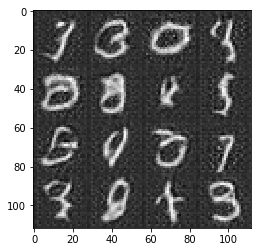

Epoch 0/2... Discriminator Loss: 1.4665... Generator Loss: 0.4850
Epoch 0/2... Discriminator Loss: 0.8119... Generator Loss: 1.4414
Epoch 0/2... Discriminator Loss: 0.7432... Generator Loss: 1.6654
Epoch 1/2... Discriminator Loss: 1.2113... Generator Loss: 0.8787
Epoch 1/2... Discriminator Loss: 0.6023... Generator Loss: 1.7768


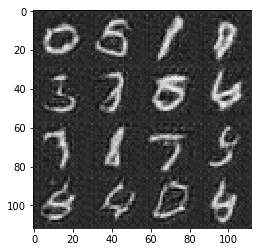

Epoch 1/2... Discriminator Loss: 0.7492... Generator Loss: 1.4501
Epoch 1/2... Discriminator Loss: 0.3899... Generator Loss: 3.5075
Epoch 1/2... Discriminator Loss: 0.5246... Generator Loss: 1.9825
Epoch 1/2... Discriminator Loss: 0.7575... Generator Loss: 1.5022
Epoch 1/2... Discriminator Loss: 0.4425... Generator Loss: 2.6825


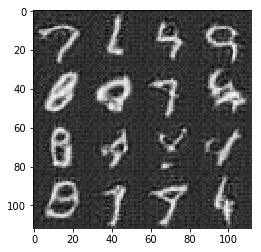

Epoch 1/2... Discriminator Loss: 0.4154... Generator Loss: 2.9390
Epoch 1/2... Discriminator Loss: 2.1139... Generator Loss: 3.7256
Epoch 1/2... Discriminator Loss: 0.5486... Generator Loss: 2.4152
Epoch 1/2... Discriminator Loss: 0.7865... Generator Loss: 1.4382
Epoch 1/2... Discriminator Loss: 0.7166... Generator Loss: 1.6391


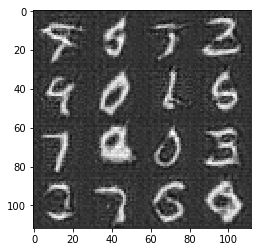

Epoch 1/2... Discriminator Loss: 0.4396... Generator Loss: 2.6570
Epoch 1/2... Discriminator Loss: 0.4053... Generator Loss: 3.7841
Epoch 1/2... Discriminator Loss: 0.4083... Generator Loss: 3.9652
Epoch 1/2... Discriminator Loss: 0.4801... Generator Loss: 2.2213
Epoch 1/2... Discriminator Loss: 2.8623... Generator Loss: 3.8459


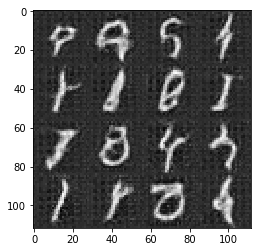

Epoch 1/2... Discriminator Loss: 1.4361... Generator Loss: 0.6072
Epoch 1/2... Discriminator Loss: 0.8878... Generator Loss: 1.5716
Epoch 1/2... Discriminator Loss: 0.8496... Generator Loss: 1.2685
Epoch 1/2... Discriminator Loss: 1.4299... Generator Loss: 0.5742
Epoch 1/2... Discriminator Loss: 1.2428... Generator Loss: 0.9985


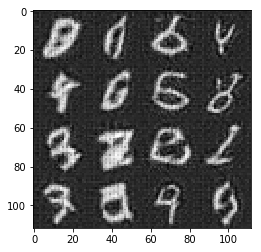

Epoch 1/2... Discriminator Loss: 0.9329... Generator Loss: 1.0164
Epoch 1/2... Discriminator Loss: 2.2923... Generator Loss: 4.2503
Epoch 1/2... Discriminator Loss: 0.7154... Generator Loss: 1.7749
Epoch 1/2... Discriminator Loss: 0.7772... Generator Loss: 2.6530
Epoch 1/2... Discriminator Loss: 0.5776... Generator Loss: 1.9152


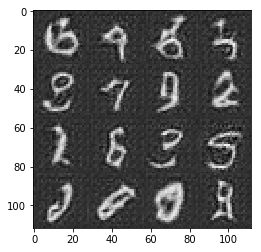

Epoch 1/2... Discriminator Loss: 0.6535... Generator Loss: 1.5915
Epoch 1/2... Discriminator Loss: 1.0030... Generator Loss: 2.5177
Epoch 1/2... Discriminator Loss: 1.0161... Generator Loss: 0.9589
Epoch 1/2... Discriminator Loss: 1.1391... Generator Loss: 0.7760
Epoch 1/2... Discriminator Loss: 0.7013... Generator Loss: 1.4640


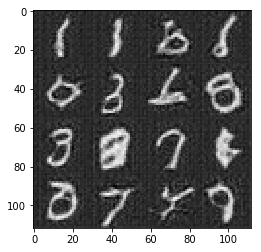

Epoch 1/2... Discriminator Loss: 0.8710... Generator Loss: 1.0877
Epoch 1/2... Discriminator Loss: 1.1670... Generator Loss: 0.8374
Epoch 1/2... Discriminator Loss: 0.5340... Generator Loss: 3.7016
Epoch 1/2... Discriminator Loss: 0.5990... Generator Loss: 1.8124
Epoch 1/2... Discriminator Loss: 0.6166... Generator Loss: 1.5800


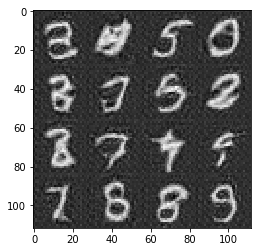

Epoch 1/2... Discriminator Loss: 0.7012... Generator Loss: 1.3871
Epoch 1/2... Discriminator Loss: 0.6746... Generator Loss: 1.9871
Epoch 1/2... Discriminator Loss: 0.4148... Generator Loss: 2.9578
Epoch 1/2... Discriminator Loss: 0.4074... Generator Loss: 3.5070
Epoch 1/2... Discriminator Loss: 1.4036... Generator Loss: 0.6353


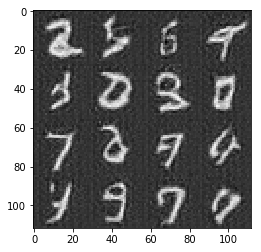

Epoch 1/2... Discriminator Loss: 0.6058... Generator Loss: 1.6902
Epoch 1/2... Discriminator Loss: 0.6500... Generator Loss: 1.8377
Epoch 1/2... Discriminator Loss: 0.4606... Generator Loss: 2.5187
Epoch 1/2... Discriminator Loss: 0.3677... Generator Loss: 3.6612
Epoch 1/2... Discriminator Loss: 0.4995... Generator Loss: 2.0859


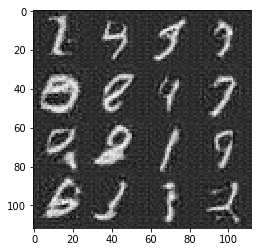

Epoch 1/2... Discriminator Loss: 0.3619... Generator Loss: 5.1265
Epoch 1/2... Discriminator Loss: 0.3879... Generator Loss: 3.1616
Epoch 1/2... Discriminator Loss: 0.3613... Generator Loss: 4.2236
Epoch 1/2... Discriminator Loss: 0.5141... Generator Loss: 1.9945
Epoch 1/2... Discriminator Loss: 0.3619... Generator Loss: 4.2019


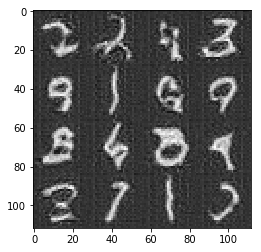

Epoch 1/2... Discriminator Loss: 0.4122... Generator Loss: 4.6648
Epoch 1/2... Discriminator Loss: 0.7336... Generator Loss: 2.4423
Epoch 1/2... Discriminator Loss: 0.6252... Generator Loss: 1.5996
Epoch 1/2... Discriminator Loss: 0.3712... Generator Loss: 4.6778
Epoch 1/2... Discriminator Loss: 3.9802... Generator Loss: 3.8797


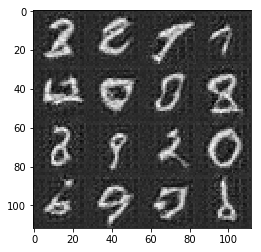

Epoch 1/2... Discriminator Loss: 1.4270... Generator Loss: 0.5895
Epoch 1/2... Discriminator Loss: 0.6535... Generator Loss: 1.9851
Epoch 1/2... Discriminator Loss: 1.1290... Generator Loss: 3.6376
Epoch 1/2... Discriminator Loss: 1.3518... Generator Loss: 0.6014
Epoch 1/2... Discriminator Loss: 1.2024... Generator Loss: 3.1889


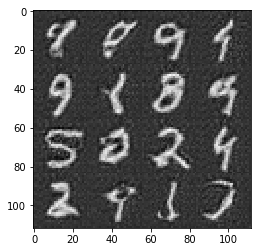

Epoch 1/2... Discriminator Loss: 0.4955... Generator Loss: 2.4061
Epoch 1/2... Discriminator Loss: 0.4525... Generator Loss: 2.4904
Epoch 1/2... Discriminator Loss: 0.3562... Generator Loss: 4.5039
Epoch 1/2... Discriminator Loss: 0.7466... Generator Loss: 1.8115
Epoch 1/2... Discriminator Loss: 0.8623... Generator Loss: 1.8247


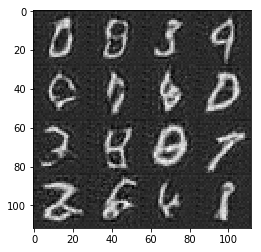

Epoch 1/2... Discriminator Loss: 1.1490... Generator Loss: 0.7670
Epoch 1/2... Discriminator Loss: 1.9645... Generator Loss: 0.4340
Epoch 1/2... Discriminator Loss: 1.7195... Generator Loss: 0.4260
Epoch 1/2... Discriminator Loss: 0.5940... Generator Loss: 1.8005
Epoch 1/2... Discriminator Loss: 0.8648... Generator Loss: 3.0051


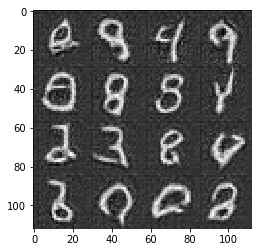

Epoch 1/2... Discriminator Loss: 0.7112... Generator Loss: 1.5704
Epoch 1/2... Discriminator Loss: 0.8565... Generator Loss: 1.0870
Epoch 1/2... Discriminator Loss: 0.5152... Generator Loss: 2.2826
Epoch 1/2... Discriminator Loss: 0.7997... Generator Loss: 1.3064
Epoch 1/2... Discriminator Loss: 0.7424... Generator Loss: 1.3227


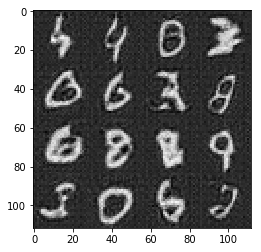

Epoch 1/2... Discriminator Loss: 0.3806... Generator Loss: 3.5732
Epoch 1/2... Discriminator Loss: 0.6786... Generator Loss: 1.4701
Epoch 1/2... Discriminator Loss: 1.5725... Generator Loss: 0.4601
Epoch 1/2... Discriminator Loss: 0.6764... Generator Loss: 1.6514
Epoch 1/2... Discriminator Loss: 0.7070... Generator Loss: 1.9272


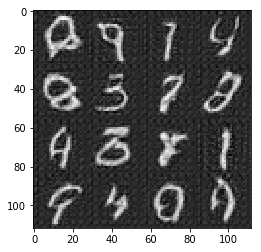

Epoch 1/2... Discriminator Loss: 0.5513... Generator Loss: 2.1601
Epoch 1/2... Discriminator Loss: 0.8007... Generator Loss: 1.1763
Epoch 1/2... Discriminator Loss: 1.0331... Generator Loss: 4.6819
Epoch 1/2... Discriminator Loss: 0.9356... Generator Loss: 3.4559
Epoch 1/2... Discriminator Loss: 0.7587... Generator Loss: 1.2868


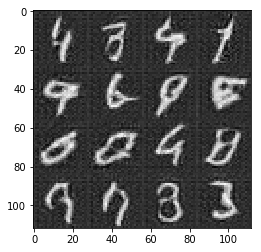

Epoch 1/2... Discriminator Loss: 0.3778... Generator Loss: 3.6488
Epoch 1/2... Discriminator Loss: 0.5925... Generator Loss: 1.6782
Epoch 1/2... Discriminator Loss: 0.4039... Generator Loss: 3.3160
Epoch 1/2... Discriminator Loss: 0.5578... Generator Loss: 1.9202
Epoch 1/2... Discriminator Loss: 0.5449... Generator Loss: 1.9619


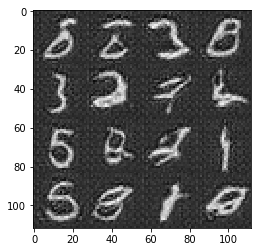

Epoch 1/2... Discriminator Loss: 0.5341... Generator Loss: 2.3761
Epoch 1/2... Discriminator Loss: 0.9550... Generator Loss: 0.9127
Epoch 1/2... Discriminator Loss: 0.4207... Generator Loss: 2.7178
Epoch 1/2... Discriminator Loss: 3.5127... Generator Loss: 0.1198
Epoch 1/2... Discriminator Loss: 0.6164... Generator Loss: 2.0627


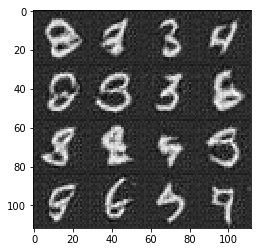

Epoch 1/2... Discriminator Loss: 0.9291... Generator Loss: 1.1568
Epoch 1/2... Discriminator Loss: 1.0508... Generator Loss: 0.8588
Epoch 1/2... Discriminator Loss: 0.4598... Generator Loss: 2.4457
Epoch 1/2... Discriminator Loss: 1.6183... Generator Loss: 0.4164
Epoch 1/2... Discriminator Loss: 1.4697... Generator Loss: 0.5473


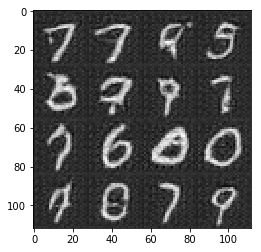

Epoch 1/2... Discriminator Loss: 1.4275... Generator Loss: 4.7223
Epoch 1/2... Discriminator Loss: 1.1378... Generator Loss: 0.7260
Epoch 1/2... Discriminator Loss: 0.6740... Generator Loss: 1.4729
Epoch 1/2... Discriminator Loss: 0.5428... Generator Loss: 1.9949
Epoch 1/2... Discriminator Loss: 0.4430... Generator Loss: 2.5922


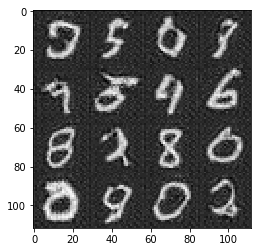

Epoch 1/2... Discriminator Loss: 0.4441... Generator Loss: 2.5902
Epoch 1/2... Discriminator Loss: 0.3664... Generator Loss: 4.5908
Epoch 1/2... Discriminator Loss: 0.4218... Generator Loss: 5.4551
Epoch 1/2... Discriminator Loss: 0.3676... Generator Loss: 3.9232
Epoch 1/2... Discriminator Loss: 0.3813... Generator Loss: 3.9769


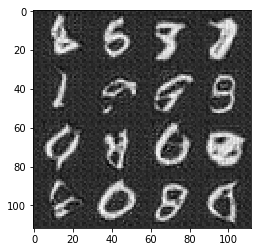

Epoch 1/2... Discriminator Loss: 0.3519... Generator Loss: 4.7585
Epoch 1/2... Discriminator Loss: 0.3908... Generator Loss: 3.7573
Epoch 1/2... Discriminator Loss: 0.3794... Generator Loss: 3.4527
Epoch 1/2... Discriminator Loss: 0.4406... Generator Loss: 2.7217
Epoch 1/2... Discriminator Loss: 3.6092... Generator Loss: 6.1554


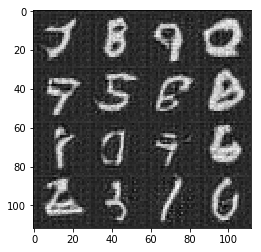

Epoch 1/2... Discriminator Loss: 0.8102... Generator Loss: 1.1504
Epoch 1/2... Discriminator Loss: 1.1082... Generator Loss: 0.8828
Epoch 1/2... Discriminator Loss: 0.9252... Generator Loss: 1.2230
Epoch 1/2... Discriminator Loss: 0.9012... Generator Loss: 0.9888
Epoch 1/2... Discriminator Loss: 1.1619... Generator Loss: 2.8326


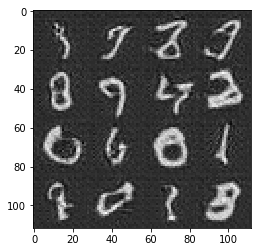

Epoch 1/2... Discriminator Loss: 0.8626... Generator Loss: 1.2882
Epoch 1/2... Discriminator Loss: 0.7496... Generator Loss: 1.4014
Epoch 1/2... Discriminator Loss: 1.8479... Generator Loss: 0.5512
Epoch 1/2... Discriminator Loss: 1.6170... Generator Loss: 0.4938
Epoch 1/2... Discriminator Loss: 0.5417... Generator Loss: 2.2073


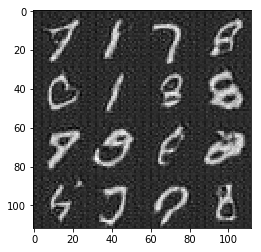

Epoch 1/2... Discriminator Loss: 0.9625... Generator Loss: 0.9651
Epoch 1/2... Discriminator Loss: 0.3512... Generator Loss: 4.4473
Epoch 1/2... Discriminator Loss: 0.9720... Generator Loss: 2.3534
Epoch 1/2... Discriminator Loss: 0.4459... Generator Loss: 2.5972
Epoch 1/2... Discriminator Loss: 1.0936... Generator Loss: 1.0536


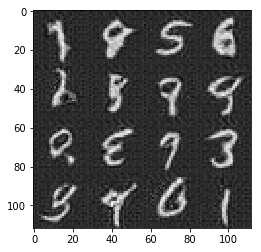

Epoch 1/2... Discriminator Loss: 0.7304... Generator Loss: 1.3051
Epoch 1/2... Discriminator Loss: 0.4501... Generator Loss: 3.3782
Epoch 1/2... Discriminator Loss: 0.3737... Generator Loss: 3.9264
Epoch 1/2... Discriminator Loss: 0.3465... Generator Loss: 5.1241
Epoch 1/2... Discriminator Loss: 0.5612... Generator Loss: 2.0788


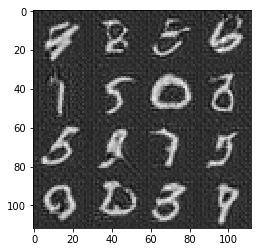

Epoch 1/2... Discriminator Loss: 0.4474... Generator Loss: 2.7533
Epoch 1/2... Discriminator Loss: 1.6973... Generator Loss: 0.4060
Epoch 1/2... Discriminator Loss: 0.5551... Generator Loss: 2.8583
Epoch 1/2... Discriminator Loss: 1.3522... Generator Loss: 0.6554
Epoch 1/2... Discriminator Loss: 0.8616... Generator Loss: 1.0931


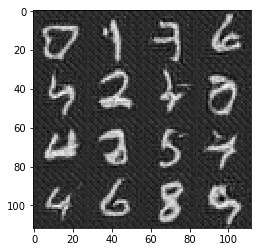

Epoch 1/2... Discriminator Loss: 1.3366... Generator Loss: 0.7827
Epoch 1/2... Discriminator Loss: 0.4916... Generator Loss: 2.2068
Epoch 1/2... Discriminator Loss: 0.3725... Generator Loss: 5.6944
Epoch 1/2... Discriminator Loss: 0.4429... Generator Loss: 2.6448
Epoch 1/2... Discriminator Loss: 0.3681... Generator Loss: 5.2551


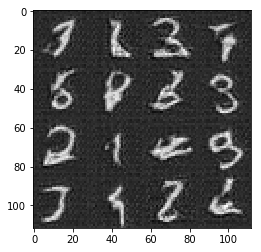

Epoch 1/2... Discriminator Loss: 3.8307... Generator Loss: 0.0931
Epoch 1/2... Discriminator Loss: 0.6999... Generator Loss: 1.5050
Epoch 1/2... Discriminator Loss: 0.5316... Generator Loss: 3.2599
Epoch 1/2... Discriminator Loss: 0.8613... Generator Loss: 1.1096
Epoch 1/2... Discriminator Loss: 0.3630... Generator Loss: 4.1251


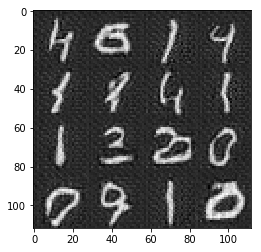

Epoch 1/2... Discriminator Loss: 2.2759... Generator Loss: 4.0140
Epoch 1/2... Discriminator Loss: 1.0502... Generator Loss: 2.7685
Epoch 1/2... Discriminator Loss: 0.6367... Generator Loss: 1.8750
Epoch 1/2... Discriminator Loss: 1.1777... Generator Loss: 0.8133
Epoch 1/2... Discriminator Loss: 0.7849... Generator Loss: 1.1614


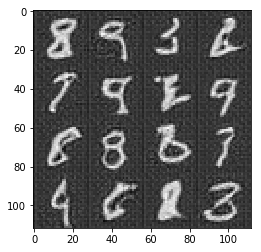

Epoch 1/2... Discriminator Loss: 0.6326... Generator Loss: 2.1751
Epoch 1/2... Discriminator Loss: 0.4354... Generator Loss: 2.9631
Epoch 1/2... Discriminator Loss: 1.8556... Generator Loss: 0.4006
Epoch 1/2... Discriminator Loss: 0.9262... Generator Loss: 0.9296
Epoch 1/2... Discriminator Loss: 0.6174... Generator Loss: 1.6827


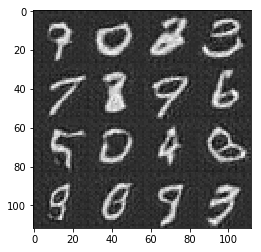

Epoch 1/2... Discriminator Loss: 0.7294... Generator Loss: 1.7033
Epoch 1/2... Discriminator Loss: 0.4858... Generator Loss: 2.3538
Epoch 1/2... Discriminator Loss: 0.5965... Generator Loss: 1.6592
Epoch 1/2... Discriminator Loss: 0.3669... Generator Loss: 4.0883
Epoch 1/2... Discriminator Loss: 0.3781... Generator Loss: 3.4509


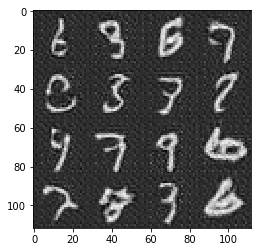

Epoch 1/2... Discriminator Loss: 0.3719... Generator Loss: 4.0858
Epoch 1/2... Discriminator Loss: 0.3729... Generator Loss: 3.5155
Epoch 1/2... Discriminator Loss: 0.5421... Generator Loss: 1.9326
Epoch 1/2... Discriminator Loss: 0.5821... Generator Loss: 1.8662
Epoch 1/2... Discriminator Loss: 0.3578... Generator Loss: 3.9407


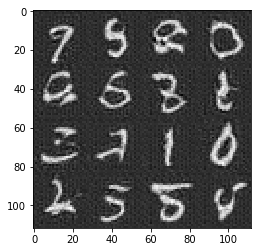

Epoch 1/2... Discriminator Loss: 0.3616... Generator Loss: 3.9003
Epoch 1/2... Discriminator Loss: 0.4082... Generator Loss: 2.9552
Epoch 1/2... Discriminator Loss: 0.3447... Generator Loss: 4.9610
Epoch 1/2... Discriminator Loss: 0.5491... Generator Loss: 2.0417
Epoch 1/2... Discriminator Loss: 0.7910... Generator Loss: 1.7824


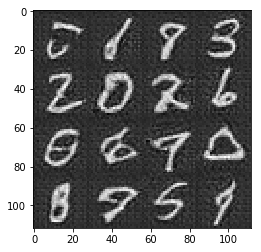

Epoch 1/2... Discriminator Loss: 0.7394... Generator Loss: 2.5034
Epoch 1/2... Discriminator Loss: 0.9072... Generator Loss: 1.2767
Epoch 1/2... Discriminator Loss: 0.8523... Generator Loss: 1.1899
Epoch 1/2... Discriminator Loss: 0.6356... Generator Loss: 1.6267
Epoch 1/2... Discriminator Loss: 0.6478... Generator Loss: 1.5319


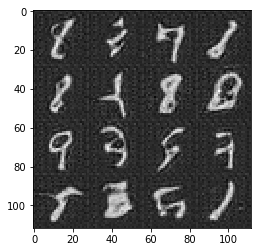

Epoch 1/2... Discriminator Loss: 0.6050... Generator Loss: 1.6709
Epoch 1/2... Discriminator Loss: 1.1196... Generator Loss: 0.7275
Epoch 1/2... Discriminator Loss: 1.0927... Generator Loss: 0.8725
Epoch 1/2... Discriminator Loss: 1.6051... Generator Loss: 0.3977
Epoch 1/2... Discriminator Loss: 0.8865... Generator Loss: 1.2159


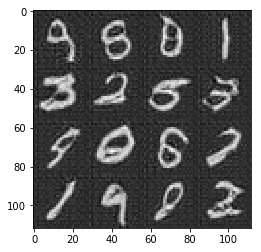

Epoch 1/2... Discriminator Loss: 1.0792... Generator Loss: 0.7526


In [31]:
batch_size = 32
z_dim = 100
learning_rate = 0.002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
在 CelebA 上运行你的 GANs 模型。在一般的GPU上运行每次迭代大约需要 20 分钟。你可以运行整个迭代，或者当 GANs 开始产生真实人脸图像时停止它。

Epoch 0/1... Discriminator Loss: 2.1322... Generator Loss: 0.3521
Epoch 0/1... Discriminator Loss: 0.5769... Generator Loss: 2.3624
Epoch 0/1... Discriminator Loss: 0.6923... Generator Loss: 1.5453
Epoch 0/1... Discriminator Loss: 0.7174... Generator Loss: 1.3688


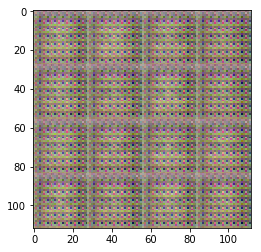

Epoch 0/1... Discriminator Loss: 0.7700... Generator Loss: 3.1928
Epoch 0/1... Discriminator Loss: 0.8496... Generator Loss: 1.1836
Epoch 0/1... Discriminator Loss: 0.6955... Generator Loss: 3.1724
Epoch 0/1... Discriminator Loss: 0.7108... Generator Loss: 1.9758
Epoch 0/1... Discriminator Loss: 0.8068... Generator Loss: 1.4356


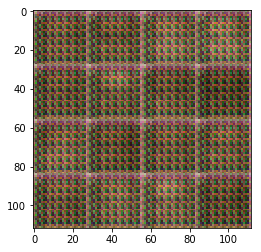

Epoch 0/1... Discriminator Loss: 1.1826... Generator Loss: 0.7544
Epoch 0/1... Discriminator Loss: 0.7516... Generator Loss: 1.5167
Epoch 0/1... Discriminator Loss: 0.7107... Generator Loss: 1.3738
Epoch 0/1... Discriminator Loss: 0.6292... Generator Loss: 4.3504
Epoch 0/1... Discriminator Loss: 0.4602... Generator Loss: 3.0206


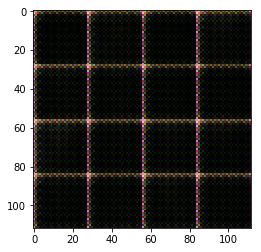

Epoch 0/1... Discriminator Loss: 0.5541... Generator Loss: 2.3876
Epoch 0/1... Discriminator Loss: 0.6069... Generator Loss: 2.7525
Epoch 0/1... Discriminator Loss: 0.5465... Generator Loss: 2.2055
Epoch 0/1... Discriminator Loss: 1.2227... Generator Loss: 0.6872
Epoch 0/1... Discriminator Loss: 0.5409... Generator Loss: 1.9647


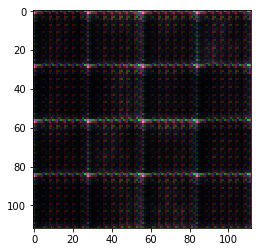

Epoch 0/1... Discriminator Loss: 0.4487... Generator Loss: 2.6266
Epoch 0/1... Discriminator Loss: 0.6695... Generator Loss: 1.5594
Epoch 0/1... Discriminator Loss: 1.2461... Generator Loss: 0.7057
Epoch 0/1... Discriminator Loss: 0.5849... Generator Loss: 4.6062
Epoch 0/1... Discriminator Loss: 2.0233... Generator Loss: 0.2553


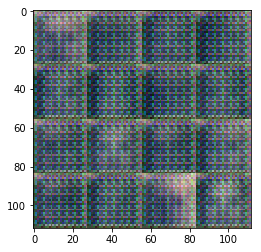

Epoch 0/1... Discriminator Loss: 0.9838... Generator Loss: 1.8595
Epoch 0/1... Discriminator Loss: 0.6659... Generator Loss: 2.2553
Epoch 0/1... Discriminator Loss: 1.2572... Generator Loss: 1.5743
Epoch 0/1... Discriminator Loss: 1.7033... Generator Loss: 0.3749
Epoch 0/1... Discriminator Loss: 0.6049... Generator Loss: 2.3743


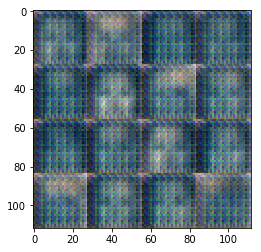

Epoch 0/1... Discriminator Loss: 2.3065... Generator Loss: 0.2882
Epoch 0/1... Discriminator Loss: 1.3066... Generator Loss: 0.7739
Epoch 0/1... Discriminator Loss: 0.5576... Generator Loss: 2.0379
Epoch 0/1... Discriminator Loss: 0.7278... Generator Loss: 1.5820
Epoch 0/1... Discriminator Loss: 1.0198... Generator Loss: 0.9004


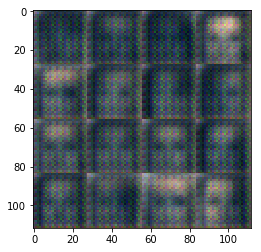

Epoch 0/1... Discriminator Loss: 1.8206... Generator Loss: 0.3861
Epoch 0/1... Discriminator Loss: 0.6305... Generator Loss: 2.1560
Epoch 0/1... Discriminator Loss: 0.5890... Generator Loss: 1.7770
Epoch 0/1... Discriminator Loss: 0.4082... Generator Loss: 4.3094
Epoch 0/1... Discriminator Loss: 0.8358... Generator Loss: 1.7425


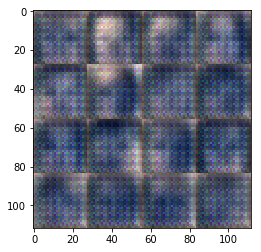

Epoch 0/1... Discriminator Loss: 0.5416... Generator Loss: 2.1168
Epoch 0/1... Discriminator Loss: 0.6204... Generator Loss: 1.6925
Epoch 0/1... Discriminator Loss: 1.6491... Generator Loss: 0.3799
Epoch 0/1... Discriminator Loss: 1.6059... Generator Loss: 0.4584
Epoch 0/1... Discriminator Loss: 0.5735... Generator Loss: 2.8962


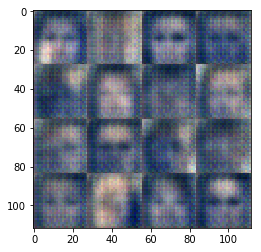

Epoch 0/1... Discriminator Loss: 0.5578... Generator Loss: 1.8537
Epoch 0/1... Discriminator Loss: 0.7109... Generator Loss: 5.7659
Epoch 0/1... Discriminator Loss: 0.6213... Generator Loss: 1.7765
Epoch 0/1... Discriminator Loss: 0.4339... Generator Loss: 6.7501
Epoch 0/1... Discriminator Loss: 0.5618... Generator Loss: 1.8752


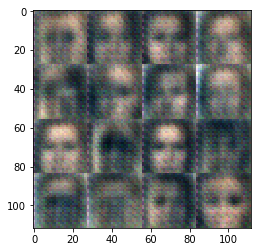

Epoch 0/1... Discriminator Loss: 1.2468... Generator Loss: 0.8954
Epoch 0/1... Discriminator Loss: 0.6970... Generator Loss: 1.5525
Epoch 0/1... Discriminator Loss: 0.5469... Generator Loss: 2.0393
Epoch 0/1... Discriminator Loss: 1.1729... Generator Loss: 0.7243
Epoch 0/1... Discriminator Loss: 0.4847... Generator Loss: 3.3569


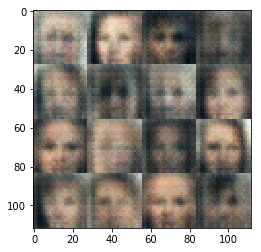

Epoch 0/1... Discriminator Loss: 0.4127... Generator Loss: 3.3220
Epoch 0/1... Discriminator Loss: 0.3902... Generator Loss: 3.3954
Epoch 0/1... Discriminator Loss: 0.9423... Generator Loss: 1.1159
Epoch 0/1... Discriminator Loss: 0.3980... Generator Loss: 3.4333
Epoch 0/1... Discriminator Loss: 0.3553... Generator Loss: 5.1979


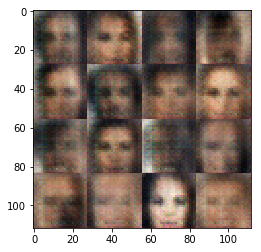

Epoch 0/1... Discriminator Loss: 0.9923... Generator Loss: 7.8379
Epoch 0/1... Discriminator Loss: 0.4454... Generator Loss: 4.4577
Epoch 0/1... Discriminator Loss: 0.4399... Generator Loss: 2.5288
Epoch 0/1... Discriminator Loss: 0.7154... Generator Loss: 1.3502
Epoch 0/1... Discriminator Loss: 0.4871... Generator Loss: 4.5867


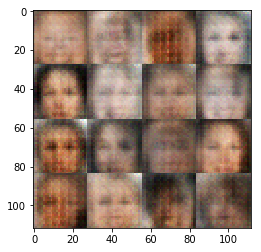

Epoch 0/1... Discriminator Loss: 1.0161... Generator Loss: 4.0448
Epoch 0/1... Discriminator Loss: 0.4168... Generator Loss: 5.9797
Epoch 0/1... Discriminator Loss: 0.3545... Generator Loss: 6.1658
Epoch 0/1... Discriminator Loss: 0.8483... Generator Loss: 1.0020
Epoch 0/1... Discriminator Loss: 1.3777... Generator Loss: 0.5057


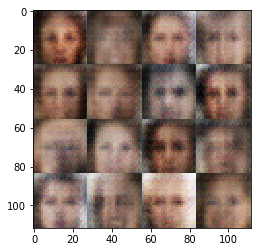

Epoch 0/1... Discriminator Loss: 0.7339... Generator Loss: 2.4350
Epoch 0/1... Discriminator Loss: 0.4072... Generator Loss: 5.2144
Epoch 0/1... Discriminator Loss: 0.3881... Generator Loss: 3.1221
Epoch 0/1... Discriminator Loss: 0.5188... Generator Loss: 2.1157
Epoch 0/1... Discriminator Loss: 0.3697... Generator Loss: 6.4396


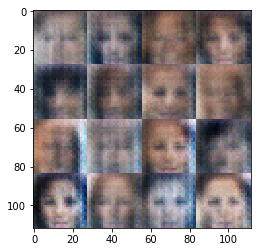

Epoch 0/1... Discriminator Loss: 0.4745... Generator Loss: 4.6793
Epoch 0/1... Discriminator Loss: 0.4100... Generator Loss: 3.0673
Epoch 0/1... Discriminator Loss: 1.5928... Generator Loss: 0.3687
Epoch 0/1... Discriminator Loss: 0.5871... Generator Loss: 4.3181
Epoch 0/1... Discriminator Loss: 0.3908... Generator Loss: 3.2631


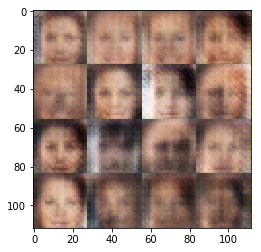

Epoch 0/1... Discriminator Loss: 0.4236... Generator Loss: 2.8412
Epoch 0/1... Discriminator Loss: 0.3562... Generator Loss: 4.6478
Epoch 0/1... Discriminator Loss: 0.3468... Generator Loss: 5.1793
Epoch 0/1... Discriminator Loss: 0.6322... Generator Loss: 1.5538
Epoch 0/1... Discriminator Loss: 0.7053... Generator Loss: 5.4856


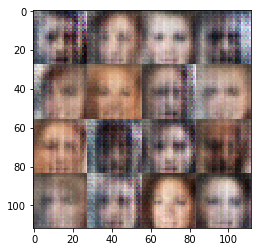

Epoch 0/1... Discriminator Loss: 1.3358... Generator Loss: 0.5230
Epoch 0/1... Discriminator Loss: 0.3988... Generator Loss: 3.0518
Epoch 0/1... Discriminator Loss: 0.3716... Generator Loss: 3.7987
Epoch 0/1... Discriminator Loss: 1.1597... Generator Loss: 0.6379
Epoch 0/1... Discriminator Loss: 0.3525... Generator Loss: 6.4360


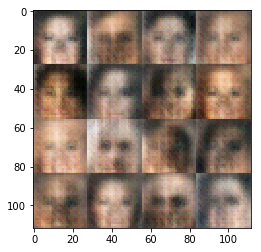

Epoch 0/1... Discriminator Loss: 0.4159... Generator Loss: 3.3975
Epoch 0/1... Discriminator Loss: 0.3486... Generator Loss: 6.1953
Epoch 0/1... Discriminator Loss: 1.1087... Generator Loss: 0.7170
Epoch 0/1... Discriminator Loss: 0.3994... Generator Loss: 3.5492
Epoch 0/1... Discriminator Loss: 0.4727... Generator Loss: 3.2911


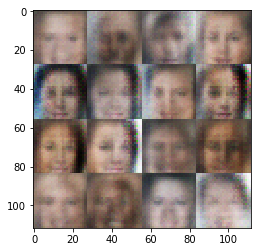

Epoch 0/1... Discriminator Loss: 0.3462... Generator Loss: 6.9006
Epoch 0/1... Discriminator Loss: 0.6271... Generator Loss: 1.5677
Epoch 0/1... Discriminator Loss: 0.3790... Generator Loss: 6.3943
Epoch 0/1... Discriminator Loss: 0.3762... Generator Loss: 7.5933
Epoch 0/1... Discriminator Loss: 0.5066... Generator Loss: 2.1166


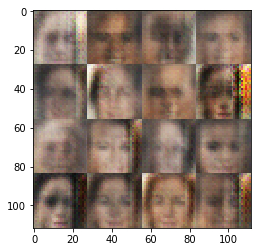

Epoch 0/1... Discriminator Loss: 1.0049... Generator Loss: 0.8519
Epoch 0/1... Discriminator Loss: 0.8802... Generator Loss: 1.0110
Epoch 0/1... Discriminator Loss: 0.3889... Generator Loss: 3.7126
Epoch 0/1... Discriminator Loss: 1.7762... Generator Loss: 0.3181
Epoch 0/1... Discriminator Loss: 0.3570... Generator Loss: 4.5885


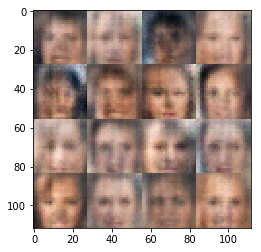

Epoch 0/1... Discriminator Loss: 0.8852... Generator Loss: 0.9328
Epoch 0/1... Discriminator Loss: 0.5973... Generator Loss: 2.0468
Epoch 0/1... Discriminator Loss: 0.3953... Generator Loss: 3.9743
Epoch 0/1... Discriminator Loss: 0.4559... Generator Loss: 8.1463
Epoch 0/1... Discriminator Loss: 1.4893... Generator Loss: 9.9387


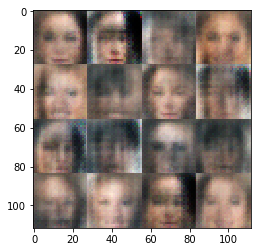

Epoch 0/1... Discriminator Loss: 0.3427... Generator Loss: 6.4638
Epoch 0/1... Discriminator Loss: 1.4043... Generator Loss: 0.4727
Epoch 0/1... Discriminator Loss: 0.5255... Generator Loss: 2.2456
Epoch 0/1... Discriminator Loss: 0.3405... Generator Loss: 6.4411
Epoch 0/1... Discriminator Loss: 0.5817... Generator Loss: 1.6894


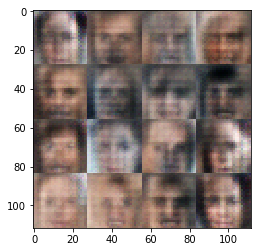

Epoch 0/1... Discriminator Loss: 0.4019... Generator Loss: 4.7359
Epoch 0/1... Discriminator Loss: 0.3619... Generator Loss: 4.3386
Epoch 0/1... Discriminator Loss: 0.4658... Generator Loss: 2.6737
Epoch 0/1... Discriminator Loss: 0.3508... Generator Loss: 4.9344
Epoch 0/1... Discriminator Loss: 1.3850... Generator Loss: 0.4803


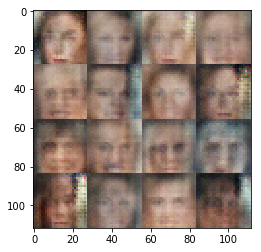

Epoch 0/1... Discriminator Loss: 0.9683... Generator Loss: 0.8214
Epoch 0/1... Discriminator Loss: 0.3436... Generator Loss: 6.7031
Epoch 0/1... Discriminator Loss: 0.4182... Generator Loss: 2.9565
Epoch 0/1... Discriminator Loss: 0.3570... Generator Loss: 7.6776
Epoch 0/1... Discriminator Loss: 0.4008... Generator Loss: 6.2726


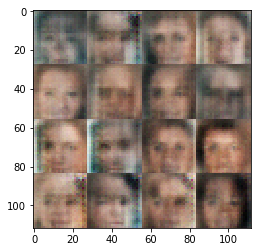

Epoch 0/1... Discriminator Loss: 0.3451... Generator Loss: 5.2596
Epoch 0/1... Discriminator Loss: 0.3362... Generator Loss: 7.0639
Epoch 0/1... Discriminator Loss: 0.5705... Generator Loss: 1.7541
Epoch 0/1... Discriminator Loss: 0.3325... Generator Loss: 8.0436
Epoch 0/1... Discriminator Loss: 0.3523... Generator Loss: 4.3521


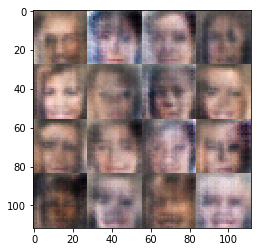

Epoch 0/1... Discriminator Loss: 0.3975... Generator Loss: 3.1287
Epoch 0/1... Discriminator Loss: 0.3931... Generator Loss: 3.3242
Epoch 0/1... Discriminator Loss: 0.3463... Generator Loss: 7.4585
Epoch 0/1... Discriminator Loss: 0.3361... Generator Loss: 6.2746
Epoch 0/1... Discriminator Loss: 0.3615... Generator Loss: 4.0752


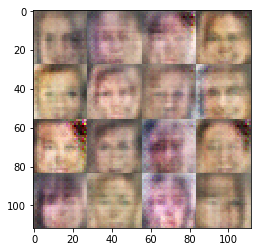

Epoch 0/1... Discriminator Loss: 0.4798... Generator Loss: 2.2312
Epoch 0/1... Discriminator Loss: 0.8534... Generator Loss: 0.9975
Epoch 0/1... Discriminator Loss: 0.3418... Generator Loss: 5.6626
Epoch 0/1... Discriminator Loss: 0.3469... Generator Loss: 6.1682
Epoch 0/1... Discriminator Loss: 0.3847... Generator Loss: 3.3685


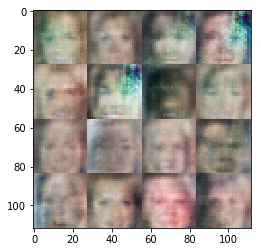

Epoch 0/1... Discriminator Loss: 0.3423... Generator Loss: 7.4661
Epoch 0/1... Discriminator Loss: 0.3448... Generator Loss: 8.3490
Epoch 0/1... Discriminator Loss: 0.3452... Generator Loss: 5.2056
Epoch 0/1... Discriminator Loss: 0.4232... Generator Loss: 2.8346
Epoch 0/1... Discriminator Loss: 0.3397... Generator Loss: 6.0916


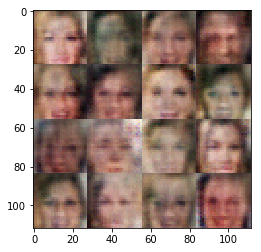

Epoch 0/1... Discriminator Loss: 0.3434... Generator Loss: 5.2043
Epoch 0/1... Discriminator Loss: 0.3959... Generator Loss: 3.0816
Epoch 0/1... Discriminator Loss: 0.3415... Generator Loss: 5.2159
Epoch 0/1... Discriminator Loss: 0.3460... Generator Loss: 8.5889
Epoch 0/1... Discriminator Loss: 0.3563... Generator Loss: 7.8249


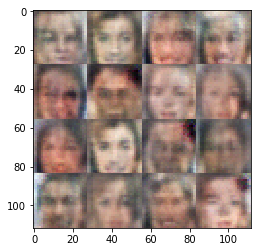

Epoch 0/1... Discriminator Loss: 0.3429... Generator Loss: 6.3293
Epoch 0/1... Discriminator Loss: 0.3659... Generator Loss: 3.5468
Epoch 0/1... Discriminator Loss: 0.3644... Generator Loss: 4.1605
Epoch 0/1... Discriminator Loss: 0.6749... Generator Loss: 8.5422
Epoch 0/1... Discriminator Loss: 0.4628... Generator Loss: 2.4588


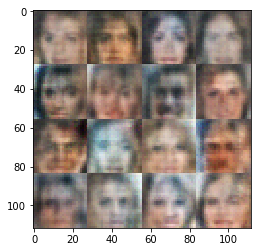

Epoch 0/1... Discriminator Loss: 0.3516... Generator Loss: 8.2170
Epoch 0/1... Discriminator Loss: 0.5331... Generator Loss: 1.9612
Epoch 0/1... Discriminator Loss: 0.4743... Generator Loss: 10.1084
Epoch 0/1... Discriminator Loss: 0.3566... Generator Loss: 9.5302
Epoch 0/1... Discriminator Loss: 0.3476... Generator Loss: 7.6401


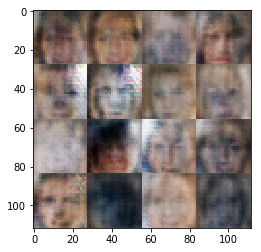

Epoch 0/1... Discriminator Loss: 0.3382... Generator Loss: 6.2102
Epoch 0/1... Discriminator Loss: 0.3527... Generator Loss: 4.3962
Epoch 0/1... Discriminator Loss: 0.3382... Generator Loss: 5.8677
Epoch 0/1... Discriminator Loss: 0.3677... Generator Loss: 4.7838
Epoch 0/1... Discriminator Loss: 0.3366... Generator Loss: 7.1887


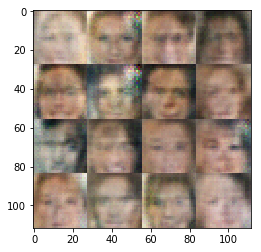

Epoch 0/1... Discriminator Loss: 0.3378... Generator Loss: 7.8556
Epoch 0/1... Discriminator Loss: 0.3538... Generator Loss: 4.7528
Epoch 0/1... Discriminator Loss: 0.3542... Generator Loss: 4.7040
Epoch 0/1... Discriminator Loss: 0.4023... Generator Loss: 2.8945
Epoch 0/1... Discriminator Loss: 0.4454... Generator Loss: 4.4653


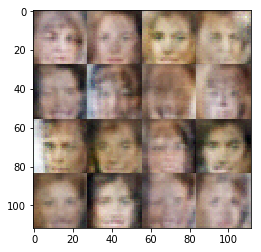

Epoch 0/1... Discriminator Loss: 0.4295... Generator Loss: 3.4412
Epoch 0/1... Discriminator Loss: 0.3571... Generator Loss: 4.6088
Epoch 0/1... Discriminator Loss: 0.6424... Generator Loss: 1.5226
Epoch 0/1... Discriminator Loss: 0.3381... Generator Loss: 6.4199
Epoch 0/1... Discriminator Loss: 0.3327... Generator Loss: 7.3097


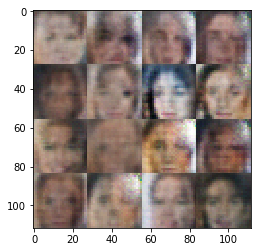

Epoch 0/1... Discriminator Loss: 0.4008... Generator Loss: 3.1776
Epoch 0/1... Discriminator Loss: 0.5833... Generator Loss: 1.7910
Epoch 0/1... Discriminator Loss: 0.4816... Generator Loss: 3.0006
Epoch 0/1... Discriminator Loss: 0.3366... Generator Loss: 7.4337
Epoch 0/1... Discriminator Loss: 0.9879... Generator Loss: 0.9257


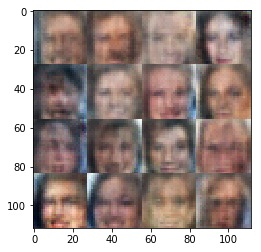

Epoch 0/1... Discriminator Loss: 0.3641... Generator Loss: 4.3680
Epoch 0/1... Discriminator Loss: 0.3429... Generator Loss: 5.8648
Epoch 0/1... Discriminator Loss: 0.3868... Generator Loss: 3.3520
Epoch 0/1... Discriminator Loss: 0.3368... Generator Loss: 6.0799
Epoch 0/1... Discriminator Loss: 0.5674... Generator Loss: 6.5723


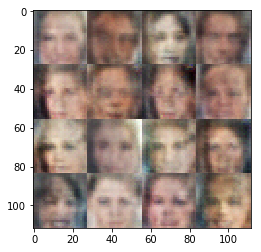

Epoch 0/1... Discriminator Loss: 0.4472... Generator Loss: 2.4309
Epoch 0/1... Discriminator Loss: 0.4346... Generator Loss: 6.0797
Epoch 0/1... Discriminator Loss: 0.3435... Generator Loss: 5.3045
Epoch 0/1... Discriminator Loss: 0.6397... Generator Loss: 1.4549
Epoch 0/1... Discriminator Loss: 0.3468... Generator Loss: 7.0171


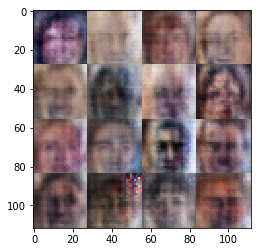

Epoch 0/1... Discriminator Loss: 0.3463... Generator Loss: 4.9512
Epoch 0/1... Discriminator Loss: 0.3394... Generator Loss: 5.8846
Epoch 0/1... Discriminator Loss: 0.3615... Generator Loss: 3.8519
Epoch 0/1... Discriminator Loss: 0.3687... Generator Loss: 4.0265
Epoch 0/1... Discriminator Loss: 0.3564... Generator Loss: 4.1136


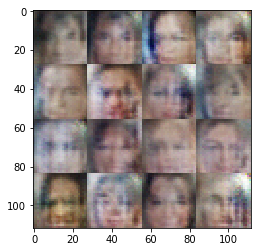

Epoch 0/1... Discriminator Loss: 0.3807... Generator Loss: 3.7784
Epoch 0/1... Discriminator Loss: 0.3395... Generator Loss: 8.6213
Epoch 0/1... Discriminator Loss: 0.3353... Generator Loss: 6.5061
Epoch 0/1... Discriminator Loss: 0.3374... Generator Loss: 6.4407
Epoch 0/1... Discriminator Loss: 0.6047... Generator Loss: 1.5084


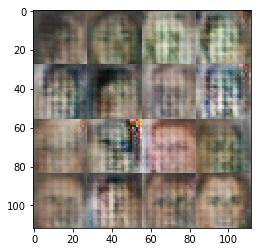

Epoch 0/1... Discriminator Loss: 0.3521... Generator Loss: 5.7128
Epoch 0/1... Discriminator Loss: 0.3375... Generator Loss: 8.7389
Epoch 0/1... Discriminator Loss: 0.3496... Generator Loss: 6.9741
Epoch 0/1... Discriminator Loss: 0.3407... Generator Loss: 5.8430
Epoch 0/1... Discriminator Loss: 0.3343... Generator Loss: 6.4120


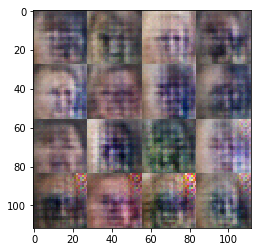

Epoch 0/1... Discriminator Loss: 0.3587... Generator Loss: 3.9064
Epoch 0/1... Discriminator Loss: 0.3422... Generator Loss: 10.3879
Epoch 0/1... Discriminator Loss: 0.3491... Generator Loss: 7.2237
Epoch 0/1... Discriminator Loss: 0.4283... Generator Loss: 2.6462
Epoch 0/1... Discriminator Loss: 0.3380... Generator Loss: 8.0967


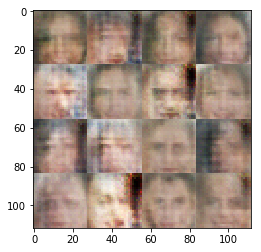

Epoch 0/1... Discriminator Loss: 0.3309... Generator Loss: 6.5240
Epoch 0/1... Discriminator Loss: 0.3829... Generator Loss: 3.3284
Epoch 0/1... Discriminator Loss: 0.3378... Generator Loss: 6.2889
Epoch 0/1... Discriminator Loss: 0.6308... Generator Loss: 1.6661
Epoch 0/1... Discriminator Loss: 0.3595... Generator Loss: 5.6110


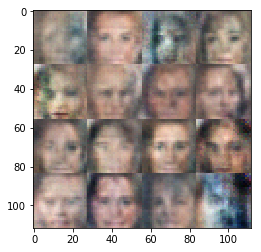

Epoch 0/1... Discriminator Loss: 0.3802... Generator Loss: 4.0695
Epoch 0/1... Discriminator Loss: 0.3585... Generator Loss: 4.0628
Epoch 0/1... Discriminator Loss: 0.3948... Generator Loss: 2.9749
Epoch 0/1... Discriminator Loss: 0.3742... Generator Loss: 3.4551
Epoch 0/1... Discriminator Loss: 0.3496... Generator Loss: 4.1881


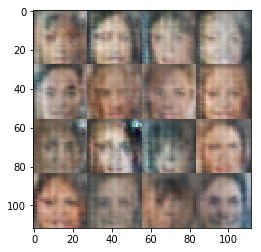

Epoch 0/1... Discriminator Loss: 0.3615... Generator Loss: 5.3367
Epoch 0/1... Discriminator Loss: 0.3890... Generator Loss: 8.3196
Epoch 0/1... Discriminator Loss: 0.7231... Generator Loss: 6.7420
Epoch 0/1... Discriminator Loss: 0.5206... Generator Loss: 1.9848
Epoch 0/1... Discriminator Loss: 0.5169... Generator Loss: 3.4987


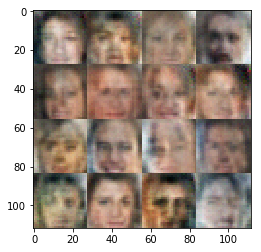

Epoch 0/1... Discriminator Loss: 0.3902... Generator Loss: 3.4936
Epoch 0/1... Discriminator Loss: 0.5470... Generator Loss: 4.4499
Epoch 0/1... Discriminator Loss: 1.1367... Generator Loss: 0.6528
Epoch 0/1... Discriminator Loss: 0.3471... Generator Loss: 4.6389
Epoch 0/1... Discriminator Loss: 0.3340... Generator Loss: 7.9443


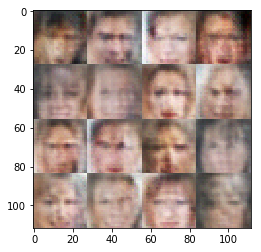

Epoch 0/1... Discriminator Loss: 0.3379... Generator Loss: 8.4983
Epoch 0/1... Discriminator Loss: 0.3797... Generator Loss: 6.5099
Epoch 0/1... Discriminator Loss: 0.4425... Generator Loss: 4.8400
Epoch 0/1... Discriminator Loss: 0.3353... Generator Loss: 6.2059
Epoch 0/1... Discriminator Loss: 0.4717... Generator Loss: 2.2988


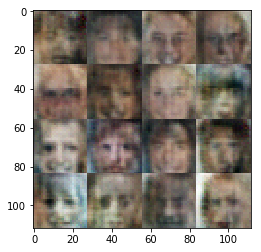

Epoch 0/1... Discriminator Loss: 3.7512... Generator Loss: 8.5988
Epoch 0/1... Discriminator Loss: 0.3403... Generator Loss: 5.5738
Epoch 0/1... Discriminator Loss: 0.3525... Generator Loss: 4.5861
Epoch 0/1... Discriminator Loss: 0.4222... Generator Loss: 3.4352
Epoch 0/1... Discriminator Loss: 0.5101... Generator Loss: 1.9841


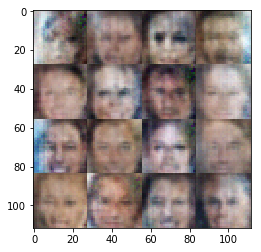

Epoch 0/1... Discriminator Loss: 0.3571... Generator Loss: 4.3046
Epoch 0/1... Discriminator Loss: 0.3391... Generator Loss: 7.5940
Epoch 0/1... Discriminator Loss: 0.4659... Generator Loss: 2.4485
Epoch 0/1... Discriminator Loss: 0.3599... Generator Loss: 5.6599
Epoch 0/1... Discriminator Loss: 0.3660... Generator Loss: 4.6222


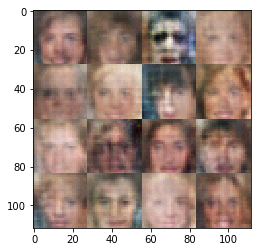

Epoch 0/1... Discriminator Loss: 0.5089... Generator Loss: 3.5081
Epoch 0/1... Discriminator Loss: 0.4859... Generator Loss: 2.6724
Epoch 0/1... Discriminator Loss: 0.3610... Generator Loss: 6.3425
Epoch 0/1... Discriminator Loss: 1.1878... Generator Loss: 0.6344
Epoch 0/1... Discriminator Loss: 1.2158... Generator Loss: 5.4640


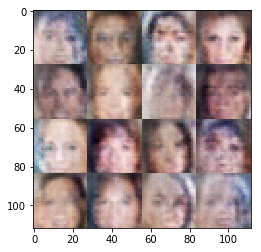

Epoch 0/1... Discriminator Loss: 0.5813... Generator Loss: 5.8305
Epoch 0/1... Discriminator Loss: 0.3521... Generator Loss: 8.9552
Epoch 0/1... Discriminator Loss: 0.6321... Generator Loss: 1.5866
Epoch 0/1... Discriminator Loss: 0.3388... Generator Loss: 7.9604
Epoch 0/1... Discriminator Loss: 0.3360... Generator Loss: 6.7587


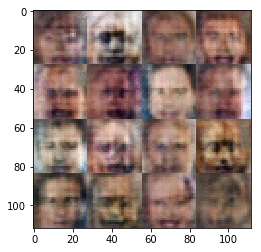

Epoch 0/1... Discriminator Loss: 0.3617... Generator Loss: 5.1228
Epoch 0/1... Discriminator Loss: 0.3478... Generator Loss: 5.5565
Epoch 0/1... Discriminator Loss: 0.3392... Generator Loss: 8.7289
Epoch 0/1... Discriminator Loss: 0.3380... Generator Loss: 7.7725
Epoch 0/1... Discriminator Loss: 0.4047... Generator Loss: 3.3950


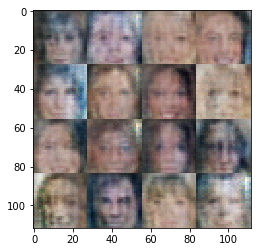

Epoch 0/1... Discriminator Loss: 0.3433... Generator Loss: 6.3482
Epoch 0/1... Discriminator Loss: 0.4215... Generator Loss: 3.0056
Epoch 0/1... Discriminator Loss: 0.6138... Generator Loss: 9.6331
Epoch 0/1... Discriminator Loss: 0.3833... Generator Loss: 3.7113
Epoch 0/1... Discriminator Loss: 0.3382... Generator Loss: 8.5840


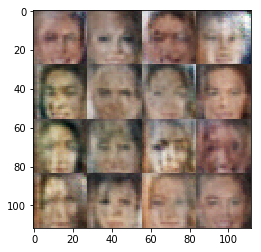

Epoch 0/1... Discriminator Loss: 0.6188... Generator Loss: 1.9058
Epoch 0/1... Discriminator Loss: 0.7089... Generator Loss: 1.8612
Epoch 0/1... Discriminator Loss: 0.7748... Generator Loss: 1.3115
Epoch 0/1... Discriminator Loss: 0.8163... Generator Loss: 1.1338
Epoch 0/1... Discriminator Loss: 0.4330... Generator Loss: 2.5671


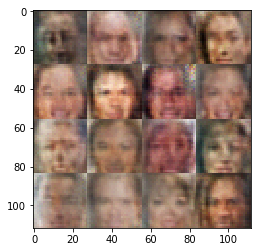

Epoch 0/1... Discriminator Loss: 0.4221... Generator Loss: 5.1183
Epoch 0/1... Discriminator Loss: 0.3477... Generator Loss: 5.6877
Epoch 0/1... Discriminator Loss: 0.3398... Generator Loss: 6.5889
Epoch 0/1... Discriminator Loss: 0.3369... Generator Loss: 7.3566
Epoch 0/1... Discriminator Loss: 0.3328... Generator Loss: 9.7899


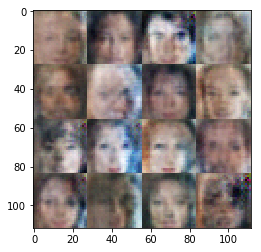

Epoch 0/1... Discriminator Loss: 0.3338... Generator Loss: 8.9410
Epoch 0/1... Discriminator Loss: 0.3390... Generator Loss: 5.3417
Epoch 0/1... Discriminator Loss: 0.3753... Generator Loss: 5.2715
Epoch 0/1... Discriminator Loss: 0.3678... Generator Loss: 3.8622
Epoch 0/1... Discriminator Loss: 0.3663... Generator Loss: 4.3967


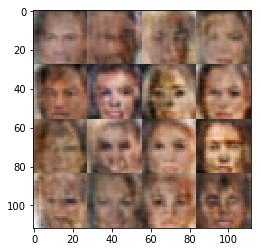

Epoch 0/1... Discriminator Loss: 0.3722... Generator Loss: 4.9536
Epoch 0/1... Discriminator Loss: 0.3393... Generator Loss: 7.9464
Epoch 0/1... Discriminator Loss: 0.3420... Generator Loss: 7.3451
Epoch 0/1... Discriminator Loss: 1.3871... Generator Loss: 0.5131
Epoch 0/1... Discriminator Loss: 0.4819... Generator Loss: 7.5655


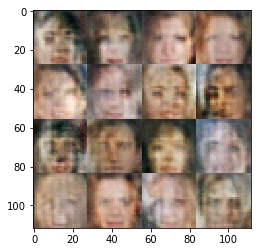

Epoch 0/1... Discriminator Loss: 0.3354... Generator Loss: 8.5932
Epoch 0/1... Discriminator Loss: 0.3549... Generator Loss: 4.4884
Epoch 0/1... Discriminator Loss: 0.5618... Generator Loss: 10.4623
Epoch 0/1... Discriminator Loss: 0.5006... Generator Loss: 2.1330
Epoch 0/1... Discriminator Loss: 0.5462... Generator Loss: 2.0011


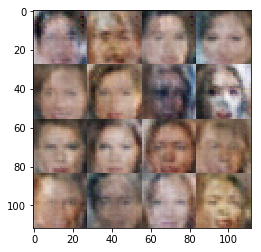

Epoch 0/1... Discriminator Loss: 0.4278... Generator Loss: 2.8292
Epoch 0/1... Discriminator Loss: 0.3565... Generator Loss: 4.6200
Epoch 0/1... Discriminator Loss: 0.3697... Generator Loss: 3.7763
Epoch 0/1... Discriminator Loss: 0.3466... Generator Loss: 7.2609
Epoch 0/1... Discriminator Loss: 0.3396... Generator Loss: 5.9608


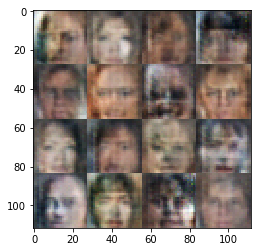

Epoch 0/1... Discriminator Loss: 0.3499... Generator Loss: 4.5158
Epoch 0/1... Discriminator Loss: 1.4081... Generator Loss: 5.7715
Epoch 0/1... Discriminator Loss: 0.7062... Generator Loss: 1.4631
Epoch 0/1... Discriminator Loss: 0.3417... Generator Loss: 6.0230
Epoch 0/1... Discriminator Loss: 0.7839... Generator Loss: 1.1873


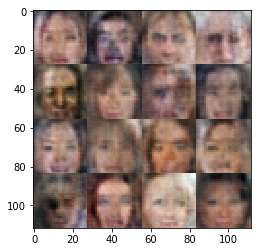

Epoch 0/1... Discriminator Loss: 0.3556... Generator Loss: 8.8042
Epoch 0/1... Discriminator Loss: 0.3568... Generator Loss: 6.3753
Epoch 0/1... Discriminator Loss: 0.8449... Generator Loss: 1.0044
Epoch 0/1... Discriminator Loss: 0.3828... Generator Loss: 3.5444
Epoch 0/1... Discriminator Loss: 1.0153... Generator Loss: 0.8006


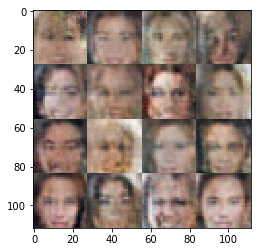

Epoch 0/1... Discriminator Loss: 0.3942... Generator Loss: 3.1777
Epoch 0/1... Discriminator Loss: 0.4047... Generator Loss: 3.8353
Epoch 0/1... Discriminator Loss: 0.5422... Generator Loss: 7.6950
Epoch 0/1... Discriminator Loss: 1.9013... Generator Loss: 10.1231
Epoch 0/1... Discriminator Loss: 0.6099... Generator Loss: 1.5714


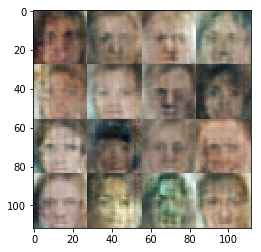

Epoch 0/1... Discriminator Loss: 0.3528... Generator Loss: 4.5455
Epoch 0/1... Discriminator Loss: 2.0903... Generator Loss: 0.2223
Epoch 0/1... Discriminator Loss: 0.4110... Generator Loss: 3.1321
Epoch 0/1... Discriminator Loss: 0.5800... Generator Loss: 8.4483
Epoch 0/1... Discriminator Loss: 0.3806... Generator Loss: 3.7389


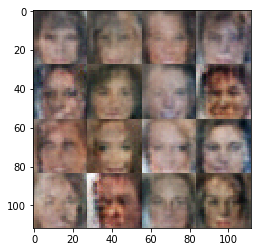

Epoch 0/1... Discriminator Loss: 0.4657... Generator Loss: 2.6045
Epoch 0/1... Discriminator Loss: 0.5743... Generator Loss: 2.0887
Epoch 0/1... Discriminator Loss: 0.3515... Generator Loss: 4.3782
Epoch 0/1... Discriminator Loss: 0.4174... Generator Loss: 4.1481
Epoch 0/1... Discriminator Loss: 0.4784... Generator Loss: 2.2078


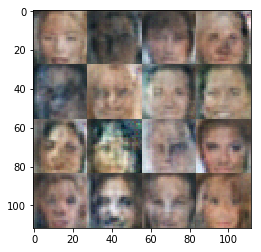

Epoch 0/1... Discriminator Loss: 0.3857... Generator Loss: 3.5809
Epoch 0/1... Discriminator Loss: 0.3813... Generator Loss: 3.7511
Epoch 0/1... Discriminator Loss: 0.3983... Generator Loss: 2.9503
Epoch 0/1... Discriminator Loss: 0.5358... Generator Loss: 1.8883
Epoch 0/1... Discriminator Loss: 0.3795... Generator Loss: 4.0768


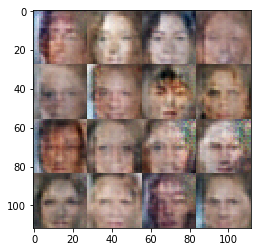

Epoch 0/1... Discriminator Loss: 1.2878... Generator Loss: 0.5847
Epoch 0/1... Discriminator Loss: 0.3742... Generator Loss: 4.4562
Epoch 0/1... Discriminator Loss: 0.3474... Generator Loss: 7.2494
Epoch 0/1... Discriminator Loss: 1.1483... Generator Loss: 0.6851
Epoch 0/1... Discriminator Loss: 1.0567... Generator Loss: 0.8276


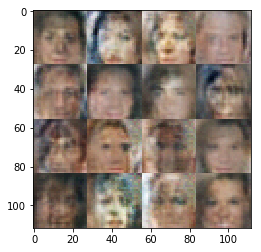

Epoch 0/1... Discriminator Loss: 1.9911... Generator Loss: 0.2513
Epoch 0/1... Discriminator Loss: 0.6064... Generator Loss: 1.6613
Epoch 0/1... Discriminator Loss: 0.3846... Generator Loss: 3.6143
Epoch 0/1... Discriminator Loss: 0.9009... Generator Loss: 1.0395
Epoch 0/1... Discriminator Loss: 0.3589... Generator Loss: 4.6003


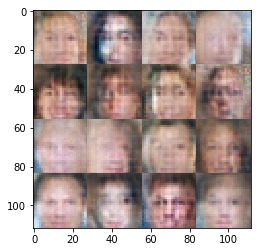

Epoch 0/1... Discriminator Loss: 0.3423... Generator Loss: 9.5388
Epoch 0/1... Discriminator Loss: 0.3569... Generator Loss: 3.8084
Epoch 0/1... Discriminator Loss: 0.3321... Generator Loss: 8.6945
Epoch 0/1... Discriminator Loss: 0.7242... Generator Loss: 1.3153
Epoch 0/1... Discriminator Loss: 0.6595... Generator Loss: 1.4083


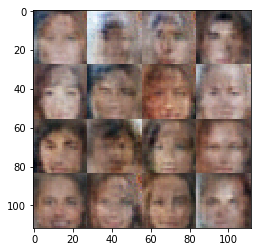

Epoch 0/1... Discriminator Loss: 0.4432... Generator Loss: 2.8325
Epoch 0/1... Discriminator Loss: 0.4489... Generator Loss: 2.4531
Epoch 0/1... Discriminator Loss: 0.3409... Generator Loss: 7.9200
Epoch 0/1... Discriminator Loss: 1.0016... Generator Loss: 5.7980
Epoch 0/1... Discriminator Loss: 0.4213... Generator Loss: 3.1959


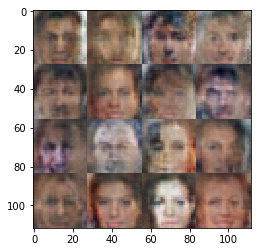

Epoch 0/1... Discriminator Loss: 0.6136... Generator Loss: 10.1588
Epoch 0/1... Discriminator Loss: 0.3402... Generator Loss: 7.1370
Epoch 0/1... Discriminator Loss: 0.6578... Generator Loss: 1.5460
Epoch 0/1... Discriminator Loss: 0.8455... Generator Loss: 7.3097
Epoch 0/1... Discriminator Loss: 0.5685... Generator Loss: 9.2988


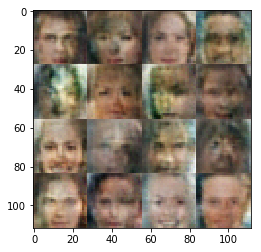

Epoch 0/1... Discriminator Loss: 0.3598... Generator Loss: 4.4996
Epoch 0/1... Discriminator Loss: 0.9555... Generator Loss: 8.3467
Epoch 0/1... Discriminator Loss: 0.3482... Generator Loss: 5.9653
Epoch 0/1... Discriminator Loss: 0.3422... Generator Loss: 7.6770
Epoch 0/1... Discriminator Loss: 0.4108... Generator Loss: 6.2358


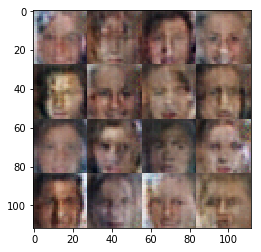

Epoch 0/1... Discriminator Loss: 0.3873... Generator Loss: 3.3914
Epoch 0/1... Discriminator Loss: 0.3686... Generator Loss: 4.0552
Epoch 0/1... Discriminator Loss: 0.3546... Generator Loss: 4.9566
Epoch 0/1... Discriminator Loss: 0.4508... Generator Loss: 2.6572
Epoch 0/1... Discriminator Loss: 0.3429... Generator Loss: 5.9679


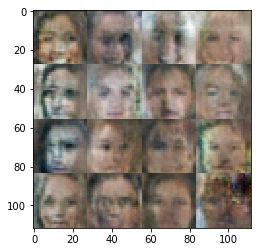

Epoch 0/1... Discriminator Loss: 1.2840... Generator Loss: 1.1970
Epoch 0/1... Discriminator Loss: 0.4497... Generator Loss: 2.3886
Epoch 0/1... Discriminator Loss: 0.3673... Generator Loss: 4.8854
Epoch 0/1... Discriminator Loss: 0.3868... Generator Loss: 3.1994
Epoch 0/1... Discriminator Loss: 0.6023... Generator Loss: 1.7763


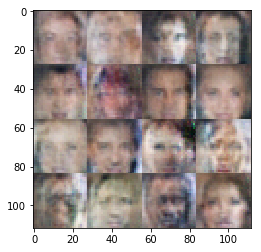

Epoch 0/1... Discriminator Loss: 0.3476... Generator Loss: 4.6648
Epoch 0/1... Discriminator Loss: 0.5334... Generator Loss: 2.0660
Epoch 0/1... Discriminator Loss: 0.3746... Generator Loss: 3.7776
Epoch 0/1... Discriminator Loss: 0.4340... Generator Loss: 2.6517
Epoch 0/1... Discriminator Loss: 0.3512... Generator Loss: 4.5414


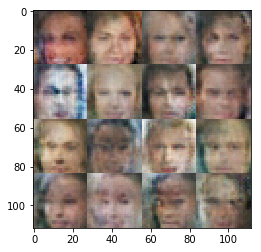

Epoch 0/1... Discriminator Loss: 0.7828... Generator Loss: 1.1225
Epoch 0/1... Discriminator Loss: 0.3420... Generator Loss: 5.4885
Epoch 0/1... Discriminator Loss: 0.5138... Generator Loss: 5.7484
Epoch 0/1... Discriminator Loss: 0.6282... Generator Loss: 1.8859
Epoch 0/1... Discriminator Loss: 0.3570... Generator Loss: 6.7208


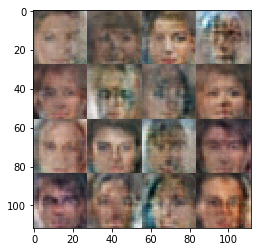

Epoch 0/1... Discriminator Loss: 0.3322... Generator Loss: 7.5888
Epoch 0/1... Discriminator Loss: 0.5461... Generator Loss: 2.0165
Epoch 0/1... Discriminator Loss: 0.3504... Generator Loss: 5.6785
Epoch 0/1... Discriminator Loss: 0.9721... Generator Loss: 0.8581
Epoch 0/1... Discriminator Loss: 0.4093... Generator Loss: 5.5734


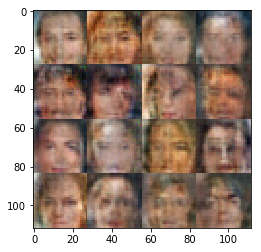

Epoch 0/1... Discriminator Loss: 0.3521... Generator Loss: 5.3273
Epoch 0/1... Discriminator Loss: 0.3352... Generator Loss: 8.4278
Epoch 0/1... Discriminator Loss: 0.5076... Generator Loss: 2.2041
Epoch 0/1... Discriminator Loss: 0.4656... Generator Loss: 2.3289
Epoch 0/1... Discriminator Loss: 0.4041... Generator Loss: 2.9182


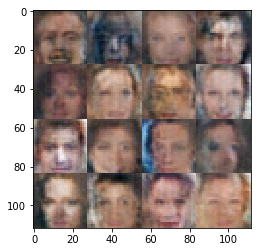

Epoch 0/1... Discriminator Loss: 1.4238... Generator Loss: 4.9301
Epoch 0/1... Discriminator Loss: 0.7349... Generator Loss: 1.3552
Epoch 0/1... Discriminator Loss: 0.4241... Generator Loss: 3.3561
Epoch 0/1... Discriminator Loss: 0.7926... Generator Loss: 1.1373
Epoch 0/1... Discriminator Loss: 1.3688... Generator Loss: 0.5375


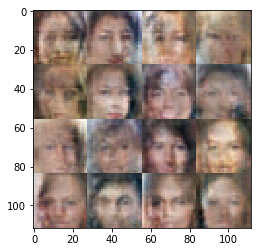

Epoch 0/1... Discriminator Loss: 0.3508... Generator Loss: 5.3330
Epoch 0/1... Discriminator Loss: 0.3426... Generator Loss: 5.4409
Epoch 0/1... Discriminator Loss: 0.6509... Generator Loss: 1.5803
Epoch 0/1... Discriminator Loss: 0.4789... Generator Loss: 2.1943
Epoch 0/1... Discriminator Loss: 0.3824... Generator Loss: 3.8324


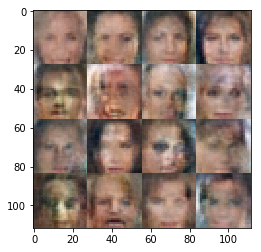

Epoch 0/1... Discriminator Loss: 0.3514... Generator Loss: 4.9049
Epoch 0/1... Discriminator Loss: 0.5431... Generator Loss: 1.8781
Epoch 0/1... Discriminator Loss: 0.3672... Generator Loss: 4.4637
Epoch 0/1... Discriminator Loss: 0.3878... Generator Loss: 4.9293
Epoch 0/1... Discriminator Loss: 0.4408... Generator Loss: 2.5681


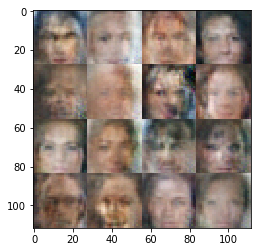

Epoch 0/1... Discriminator Loss: 0.4360... Generator Loss: 2.5260
Epoch 0/1... Discriminator Loss: 0.3462... Generator Loss: 4.9160
Epoch 0/1... Discriminator Loss: 0.5295... Generator Loss: 1.9358
Epoch 0/1... Discriminator Loss: 0.3567... Generator Loss: 4.2237
Epoch 0/1... Discriminator Loss: 0.3364... Generator Loss: 7.7979


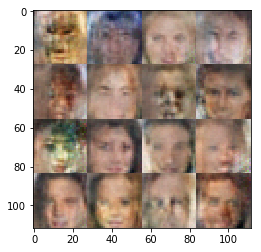

Epoch 0/1... Discriminator Loss: 0.3377... Generator Loss: 6.0602
Epoch 0/1... Discriminator Loss: 0.7206... Generator Loss: 1.2625
Epoch 0/1... Discriminator Loss: 0.6884... Generator Loss: 5.0005
Epoch 0/1... Discriminator Loss: 0.7526... Generator Loss: 1.3218
Epoch 0/1... Discriminator Loss: 0.3705... Generator Loss: 3.8679


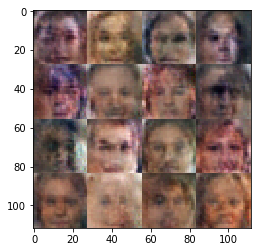

Epoch 0/1... Discriminator Loss: 2.4957... Generator Loss: 0.1826
Epoch 0/1... Discriminator Loss: 0.5933... Generator Loss: 1.6107
Epoch 0/1... Discriminator Loss: 1.2064... Generator Loss: 0.6791
Epoch 0/1... Discriminator Loss: 0.6613... Generator Loss: 2.1838
Epoch 0/1... Discriminator Loss: 0.6792... Generator Loss: 1.4701


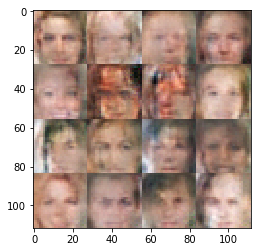

Epoch 0/1... Discriminator Loss: 0.9402... Generator Loss: 0.9515
Epoch 0/1... Discriminator Loss: 0.9617... Generator Loss: 0.9021
Epoch 0/1... Discriminator Loss: 0.5550... Generator Loss: 1.9030
Epoch 0/1... Discriminator Loss: 0.4551... Generator Loss: 7.3086
Epoch 0/1... Discriminator Loss: 2.1693... Generator Loss: 0.2122


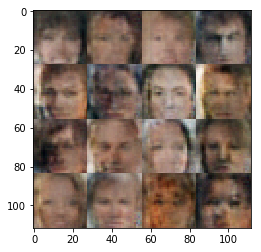

Epoch 0/1... Discriminator Loss: 1.3060... Generator Loss: 0.5977
Epoch 0/1... Discriminator Loss: 0.3841... Generator Loss: 3.3524
Epoch 0/1... Discriminator Loss: 0.3466... Generator Loss: 6.2028
Epoch 0/1... Discriminator Loss: 0.3411... Generator Loss: 6.3480
Epoch 0/1... Discriminator Loss: 0.6516... Generator Loss: 1.5640


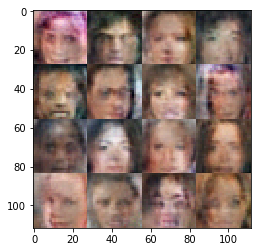

Epoch 0/1... Discriminator Loss: 0.3496... Generator Loss: 5.5064
Epoch 0/1... Discriminator Loss: 0.3661... Generator Loss: 3.7390
Epoch 0/1... Discriminator Loss: 0.3406... Generator Loss: 5.2042
Epoch 0/1... Discriminator Loss: 0.6517... Generator Loss: 1.5014
Epoch 0/1... Discriminator Loss: 0.3886... Generator Loss: 4.2620


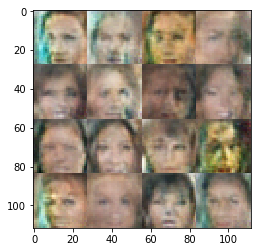

Epoch 0/1... Discriminator Loss: 1.3104... Generator Loss: 0.5529
Epoch 0/1... Discriminator Loss: 0.3419... Generator Loss: 5.9292
Epoch 0/1... Discriminator Loss: 0.3645... Generator Loss: 6.7289
Epoch 0/1... Discriminator Loss: 0.3713... Generator Loss: 8.2538
Epoch 0/1... Discriminator Loss: 0.4324... Generator Loss: 3.0238


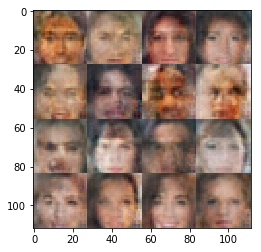

Epoch 0/1... Discriminator Loss: 0.4256... Generator Loss: 2.6258
Epoch 0/1... Discriminator Loss: 0.5071... Generator Loss: 3.4486
Epoch 0/1... Discriminator Loss: 0.7378... Generator Loss: 1.2403
Epoch 0/1... Discriminator Loss: 0.4369... Generator Loss: 9.7532
Epoch 0/1... Discriminator Loss: 0.3773... Generator Loss: 3.7150


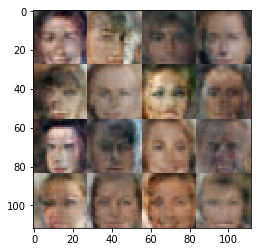

Epoch 0/1... Discriminator Loss: 0.3693... Generator Loss: 4.2522
Epoch 0/1... Discriminator Loss: 0.3957... Generator Loss: 3.9055
Epoch 0/1... Discriminator Loss: 0.3681... Generator Loss: 4.4467
Epoch 0/1... Discriminator Loss: 0.3394... Generator Loss: 5.1836
Epoch 0/1... Discriminator Loss: 0.5593... Generator Loss: 1.9503


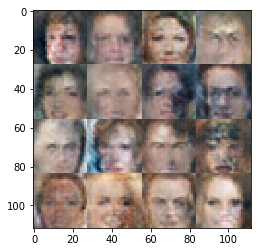

Epoch 0/1... Discriminator Loss: 0.3478... Generator Loss: 4.6224
Epoch 0/1... Discriminator Loss: 0.3525... Generator Loss: 4.6472
Epoch 0/1... Discriminator Loss: 0.4033... Generator Loss: 3.7574
Epoch 0/1... Discriminator Loss: 0.3510... Generator Loss: 6.2040
Epoch 0/1... Discriminator Loss: 0.3550... Generator Loss: 4.3389


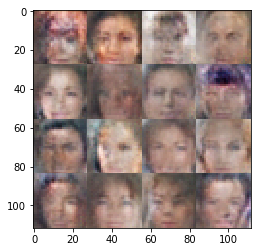

Epoch 0/1... Discriminator Loss: 0.4155... Generator Loss: 7.9408
Epoch 0/1... Discriminator Loss: 0.3473... Generator Loss: 5.0546
Epoch 0/1... Discriminator Loss: 0.4994... Generator Loss: 2.2914
Epoch 0/1... Discriminator Loss: 0.4999... Generator Loss: 2.3991
Epoch 0/1... Discriminator Loss: 0.3404... Generator Loss: 7.1212


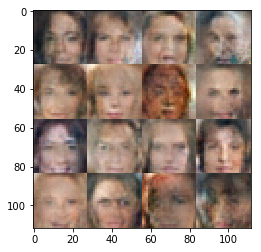

Epoch 0/1... Discriminator Loss: 0.3375... Generator Loss: 9.7748
Epoch 0/1... Discriminator Loss: 0.3563... Generator Loss: 4.4060
Epoch 0/1... Discriminator Loss: 0.3441... Generator Loss: 4.9602
Epoch 0/1... Discriminator Loss: 0.8329... Generator Loss: 1.0821
Epoch 0/1... Discriminator Loss: 1.6702... Generator Loss: 3.2057


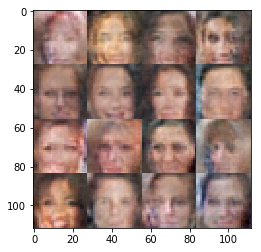

Epoch 0/1... Discriminator Loss: 0.8472... Generator Loss: 1.1643
Epoch 0/1... Discriminator Loss: 0.3648... Generator Loss: 5.9532
Epoch 0/1... Discriminator Loss: 0.3739... Generator Loss: 5.5165
Epoch 0/1... Discriminator Loss: 0.3662... Generator Loss: 4.3932
Epoch 0/1... Discriminator Loss: 1.5476... Generator Loss: 4.6878


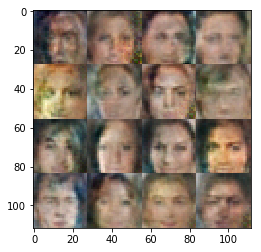

Epoch 0/1... Discriminator Loss: 0.3742... Generator Loss: 5.0236
Epoch 0/1... Discriminator Loss: 0.5030... Generator Loss: 2.4598
Epoch 0/1... Discriminator Loss: 1.7624... Generator Loss: 0.4272
Epoch 0/1... Discriminator Loss: 0.6228... Generator Loss: 1.7441
Epoch 0/1... Discriminator Loss: 1.5731... Generator Loss: 3.2286


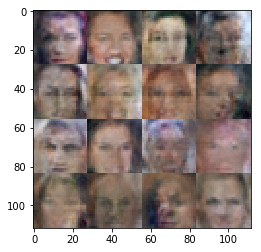

Epoch 0/1... Discriminator Loss: 1.0032... Generator Loss: 0.9012
Epoch 0/1... Discriminator Loss: 0.3653... Generator Loss: 5.4318
Epoch 0/1... Discriminator Loss: 0.6314... Generator Loss: 1.5867
Epoch 0/1... Discriminator Loss: 0.3841... Generator Loss: 5.1602
Epoch 0/1... Discriminator Loss: 0.9577... Generator Loss: 0.9174


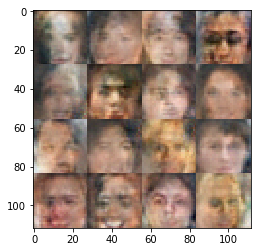

Epoch 0/1... Discriminator Loss: 0.3938... Generator Loss: 4.4206
Epoch 0/1... Discriminator Loss: 1.5527... Generator Loss: 0.4640
Epoch 0/1... Discriminator Loss: 0.4135... Generator Loss: 2.8877
Epoch 0/1... Discriminator Loss: 0.6549... Generator Loss: 5.0795
Epoch 0/1... Discriminator Loss: 0.3682... Generator Loss: 4.0805


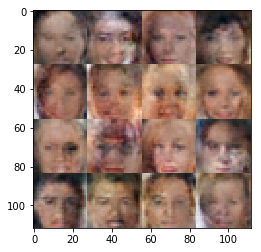

Epoch 0/1... Discriminator Loss: 0.6465... Generator Loss: 1.8049
Epoch 0/1... Discriminator Loss: 0.3385... Generator Loss: 6.3242
Epoch 0/1... Discriminator Loss: 0.4007... Generator Loss: 3.1786
Epoch 0/1... Discriminator Loss: 0.3973... Generator Loss: 3.2418
Epoch 0/1... Discriminator Loss: 0.4239... Generator Loss: 6.4641


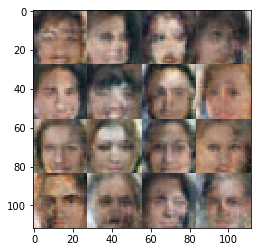

Epoch 0/1... Discriminator Loss: 0.3563... Generator Loss: 4.4492
Epoch 0/1... Discriminator Loss: 0.3479... Generator Loss: 6.4621
Epoch 0/1... Discriminator Loss: 0.5275... Generator Loss: 2.1087
Epoch 0/1... Discriminator Loss: 0.5359... Generator Loss: 1.9406
Epoch 0/1... Discriminator Loss: 0.3584... Generator Loss: 6.7530


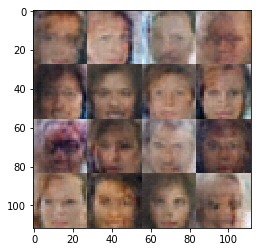

Epoch 0/1... Discriminator Loss: 0.3441... Generator Loss: 6.2487
Epoch 0/1... Discriminator Loss: 0.3363... Generator Loss: 7.2988
Epoch 0/1... Discriminator Loss: 0.7254... Generator Loss: 7.9854
Epoch 0/1... Discriminator Loss: 0.4358... Generator Loss: 3.0940
Epoch 0/1... Discriminator Loss: 0.4598... Generator Loss: 2.4995


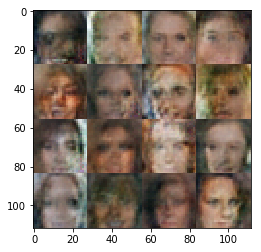

Epoch 0/1... Discriminator Loss: 0.3773... Generator Loss: 5.0527
Epoch 0/1... Discriminator Loss: 0.3441... Generator Loss: 6.3700
Epoch 0/1... Discriminator Loss: 0.6515... Generator Loss: 1.5572
Epoch 0/1... Discriminator Loss: 0.9221... Generator Loss: 0.9743
Epoch 0/1... Discriminator Loss: 0.4469... Generator Loss: 2.6881


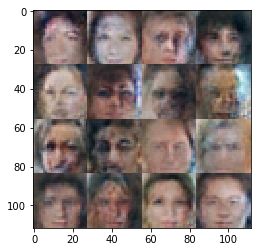

Epoch 0/1... Discriminator Loss: 0.5474... Generator Loss: 1.9286
Epoch 0/1... Discriminator Loss: 0.3721... Generator Loss: 5.1423
Epoch 0/1... Discriminator Loss: 0.4685... Generator Loss: 5.9217
Epoch 0/1... Discriminator Loss: 0.4757... Generator Loss: 2.3562
Epoch 0/1... Discriminator Loss: 0.7750... Generator Loss: 4.5556


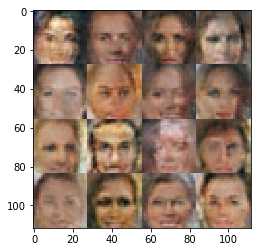

Epoch 0/1... Discriminator Loss: 0.4092... Generator Loss: 2.9809
Epoch 0/1... Discriminator Loss: 0.4080... Generator Loss: 5.7687
Epoch 0/1... Discriminator Loss: 0.3637... Generator Loss: 7.1305
Epoch 0/1... Discriminator Loss: 0.5026... Generator Loss: 2.8778
Epoch 0/1... Discriminator Loss: 0.3462... Generator Loss: 7.4932


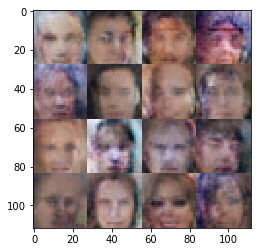

Epoch 0/1... Discriminator Loss: 0.9883... Generator Loss: 2.3307
Epoch 0/1... Discriminator Loss: 0.6869... Generator Loss: 1.4809
Epoch 0/1... Discriminator Loss: 0.3576... Generator Loss: 6.6171
Epoch 0/1... Discriminator Loss: 0.3480... Generator Loss: 6.1235
Epoch 0/1... Discriminator Loss: 0.8327... Generator Loss: 1.1298


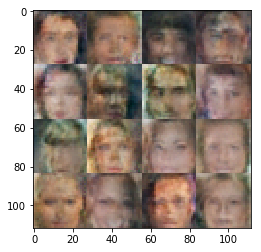

Epoch 0/1... Discriminator Loss: 0.3911... Generator Loss: 5.3313
Epoch 0/1... Discriminator Loss: 0.4204... Generator Loss: 4.1866
Epoch 0/1... Discriminator Loss: 0.4824... Generator Loss: 2.4902
Epoch 0/1... Discriminator Loss: 0.5458... Generator Loss: 5.2943
Epoch 0/1... Discriminator Loss: 0.4257... Generator Loss: 2.7718


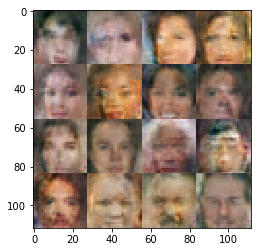

Epoch 0/1... Discriminator Loss: 0.4296... Generator Loss: 9.4854
Epoch 0/1... Discriminator Loss: 1.9072... Generator Loss: 0.3580
Epoch 0/1... Discriminator Loss: 0.3416... Generator Loss: 7.5748
Epoch 0/1... Discriminator Loss: 0.3629... Generator Loss: 4.2428
Epoch 0/1... Discriminator Loss: 0.4024... Generator Loss: 3.2088


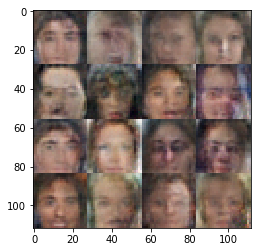

Epoch 0/1... Discriminator Loss: 0.3437... Generator Loss: 6.0325
Epoch 0/1... Discriminator Loss: 0.8024... Generator Loss: 3.1104
Epoch 0/1... Discriminator Loss: 0.4771... Generator Loss: 6.6581
Epoch 0/1... Discriminator Loss: 0.3863... Generator Loss: 3.8694
Epoch 0/1... Discriminator Loss: 0.3938... Generator Loss: 4.3628


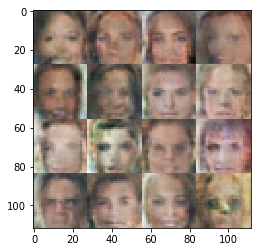

Epoch 0/1... Discriminator Loss: 0.6436... Generator Loss: 9.4651
Epoch 0/1... Discriminator Loss: 0.3447... Generator Loss: 5.7084
Epoch 0/1... Discriminator Loss: 3.3481... Generator Loss: 5.2410
Epoch 0/1... Discriminator Loss: 0.5455... Generator Loss: 2.7196
Epoch 0/1... Discriminator Loss: 0.3921... Generator Loss: 3.4169


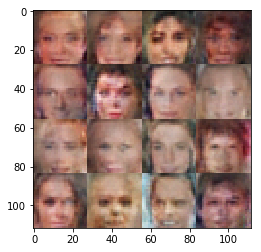

Epoch 0/1... Discriminator Loss: 0.4473... Generator Loss: 2.8178
Epoch 0/1... Discriminator Loss: 1.5637... Generator Loss: 7.7428
Epoch 0/1... Discriminator Loss: 0.9831... Generator Loss: 0.8669
Epoch 0/1... Discriminator Loss: 0.4757... Generator Loss: 2.3906
Epoch 0/1... Discriminator Loss: 0.6809... Generator Loss: 1.4641


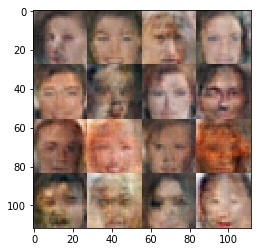

Epoch 0/1... Discriminator Loss: 0.6650... Generator Loss: 2.6603
Epoch 0/1... Discriminator Loss: 0.3385... Generator Loss: 6.7094
Epoch 0/1... Discriminator Loss: 0.6046... Generator Loss: 2.2216
Epoch 0/1... Discriminator Loss: 0.4019... Generator Loss: 3.1552
Epoch 0/1... Discriminator Loss: 0.9950... Generator Loss: 0.8607


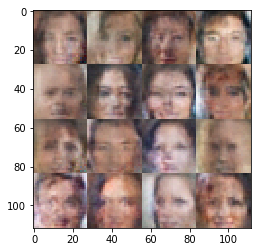

Epoch 0/1... Discriminator Loss: 0.3736... Generator Loss: 3.9547
Epoch 0/1... Discriminator Loss: 0.4128... Generator Loss: 6.8724
Epoch 0/1... Discriminator Loss: 0.3559... Generator Loss: 5.3501
Epoch 0/1... Discriminator Loss: 1.0098... Generator Loss: 0.8466
Epoch 0/1... Discriminator Loss: 0.7007... Generator Loss: 2.8979


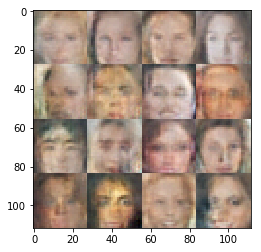

Epoch 0/1... Discriminator Loss: 0.4295... Generator Loss: 2.9805
Epoch 0/1... Discriminator Loss: 0.5905... Generator Loss: 1.6648
Epoch 0/1... Discriminator Loss: 0.3718... Generator Loss: 4.6014
Epoch 0/1... Discriminator Loss: 0.3932... Generator Loss: 3.5304
Epoch 0/1... Discriminator Loss: 0.3485... Generator Loss: 5.8811


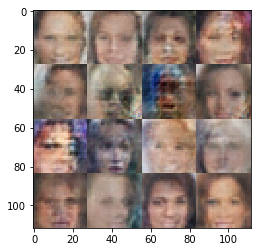

Epoch 0/1... Discriminator Loss: 0.5329... Generator Loss: 2.0503
Epoch 0/1... Discriminator Loss: 0.4035... Generator Loss: 3.9236
Epoch 0/1... Discriminator Loss: 0.4373... Generator Loss: 2.7948
Epoch 0/1... Discriminator Loss: 0.3766... Generator Loss: 3.9156
Epoch 0/1... Discriminator Loss: 1.2038... Generator Loss: 0.7275


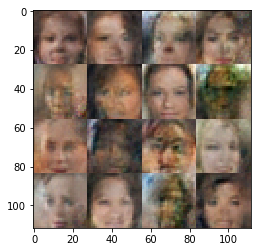

Epoch 0/1... Discriminator Loss: 0.9822... Generator Loss: 1.0220
Epoch 0/1... Discriminator Loss: 0.3815... Generator Loss: 5.4508
Epoch 0/1... Discriminator Loss: 0.3460... Generator Loss: 7.4184
Epoch 0/1... Discriminator Loss: 0.4187... Generator Loss: 3.2714
Epoch 0/1... Discriminator Loss: 0.3625... Generator Loss: 3.9417


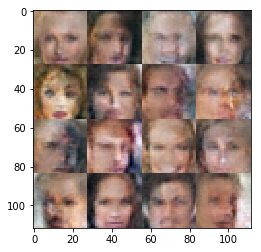

Epoch 0/1... Discriminator Loss: 1.2124... Generator Loss: 2.5320
Epoch 0/1... Discriminator Loss: 0.6423... Generator Loss: 1.5458
Epoch 0/1... Discriminator Loss: 0.5881... Generator Loss: 5.0621
Epoch 0/1... Discriminator Loss: 0.3719... Generator Loss: 4.2456
Epoch 0/1... Discriminator Loss: 0.3699... Generator Loss: 4.4490


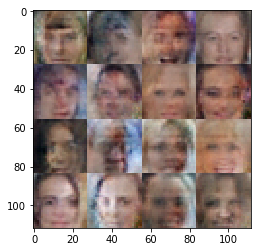

Epoch 0/1... Discriminator Loss: 0.4374... Generator Loss: 3.8016
Epoch 0/1... Discriminator Loss: 0.3404... Generator Loss: 8.6692
Epoch 0/1... Discriminator Loss: 1.2917... Generator Loss: 0.6304
Epoch 0/1... Discriminator Loss: 0.3667... Generator Loss: 4.3072
Epoch 0/1... Discriminator Loss: 0.3942... Generator Loss: 6.0941


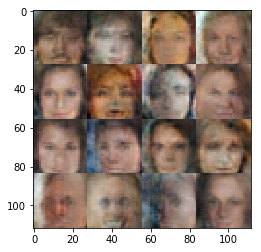

Epoch 0/1... Discriminator Loss: 0.4714... Generator Loss: 2.4557
Epoch 0/1... Discriminator Loss: 0.6727... Generator Loss: 1.4082
Epoch 0/1... Discriminator Loss: 0.3722... Generator Loss: 3.7559
Epoch 0/1... Discriminator Loss: 0.7180... Generator Loss: 1.3722
Epoch 0/1... Discriminator Loss: 0.4096... Generator Loss: 3.4535


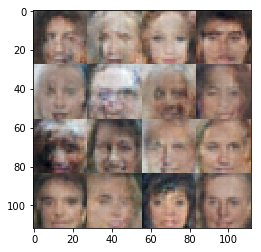

Epoch 0/1... Discriminator Loss: 0.4267... Generator Loss: 5.8650
Epoch 0/1... Discriminator Loss: 0.3590... Generator Loss: 4.2513
Epoch 0/1... Discriminator Loss: 0.3864... Generator Loss: 3.7485
Epoch 0/1... Discriminator Loss: 1.6512... Generator Loss: 0.4484
Epoch 0/1... Discriminator Loss: 0.4327... Generator Loss: 3.6897


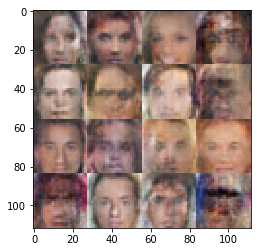

Epoch 0/1... Discriminator Loss: 1.6132... Generator Loss: 1.9582
Epoch 0/1... Discriminator Loss: 0.5075... Generator Loss: 2.9973
Epoch 0/1... Discriminator Loss: 0.4164... Generator Loss: 2.9456
Epoch 0/1... Discriminator Loss: 0.4563... Generator Loss: 2.6228
Epoch 0/1... Discriminator Loss: 0.5151... Generator Loss: 2.7759


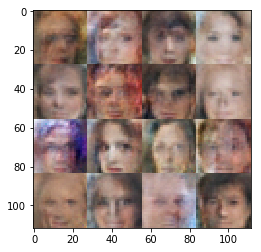

Epoch 0/1... Discriminator Loss: 0.3737... Generator Loss: 5.0817
Epoch 0/1... Discriminator Loss: 0.4039... Generator Loss: 5.5691
Epoch 0/1... Discriminator Loss: 0.6894... Generator Loss: 8.9931
Epoch 0/1... Discriminator Loss: 0.3364... Generator Loss: 8.8116
Epoch 0/1... Discriminator Loss: 0.4703... Generator Loss: 2.9486


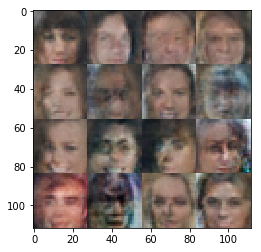

Epoch 0/1... Discriminator Loss: 0.6233... Generator Loss: 1.5921
Epoch 0/1... Discriminator Loss: 0.3532... Generator Loss: 6.2495
Epoch 0/1... Discriminator Loss: 1.6779... Generator Loss: 0.3796
Epoch 0/1... Discriminator Loss: 1.4925... Generator Loss: 0.4720
Epoch 0/1... Discriminator Loss: 0.6465... Generator Loss: 1.5598


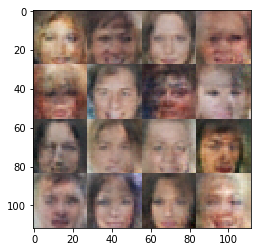

Epoch 0/1... Discriminator Loss: 0.4021... Generator Loss: 3.4662
Epoch 0/1... Discriminator Loss: 0.4042... Generator Loss: 3.6989
Epoch 0/1... Discriminator Loss: 0.3582... Generator Loss: 5.4631
Epoch 0/1... Discriminator Loss: 0.6787... Generator Loss: 1.5271
Epoch 0/1... Discriminator Loss: 1.6085... Generator Loss: 0.4251


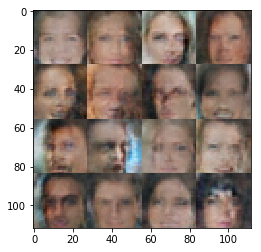

Epoch 0/1... Discriminator Loss: 0.3716... Generator Loss: 4.4847
Epoch 0/1... Discriminator Loss: 0.6261... Generator Loss: 1.8207
Epoch 0/1... Discriminator Loss: 0.4058... Generator Loss: 3.5802
Epoch 0/1... Discriminator Loss: 0.4760... Generator Loss: 2.4062
Epoch 0/1... Discriminator Loss: 0.6215... Generator Loss: 1.7357


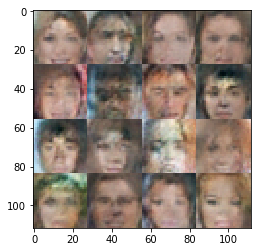

Epoch 0/1... Discriminator Loss: 1.1918... Generator Loss: 0.7108
Epoch 0/1... Discriminator Loss: 0.4850... Generator Loss: 2.4595
Epoch 0/1... Discriminator Loss: 0.4307... Generator Loss: 3.7987
Epoch 0/1... Discriminator Loss: 0.5572... Generator Loss: 1.9147
Epoch 0/1... Discriminator Loss: 1.4661... Generator Loss: 0.5005


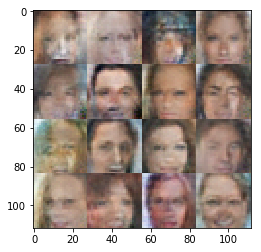

Epoch 0/1... Discriminator Loss: 0.3566... Generator Loss: 4.6947
Epoch 0/1... Discriminator Loss: 0.9747... Generator Loss: 0.9349
Epoch 0/1... Discriminator Loss: 0.5895... Generator Loss: 1.7196
Epoch 0/1... Discriminator Loss: 0.5101... Generator Loss: 2.1165
Epoch 0/1... Discriminator Loss: 0.6361... Generator Loss: 1.5810


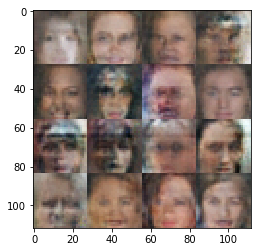

Epoch 0/1... Discriminator Loss: 0.4577... Generator Loss: 3.0033
Epoch 0/1... Discriminator Loss: 0.4003... Generator Loss: 3.2542
Epoch 0/1... Discriminator Loss: 0.3835... Generator Loss: 6.5506
Epoch 0/1... Discriminator Loss: 0.4391... Generator Loss: 3.4860
Epoch 0/1... Discriminator Loss: 0.3950... Generator Loss: 5.7408


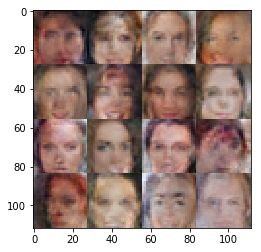

Epoch 0/1... Discriminator Loss: 0.5138... Generator Loss: 2.2154
Epoch 0/1... Discriminator Loss: 0.3605... Generator Loss: 4.6422
Epoch 0/1... Discriminator Loss: 1.6644... Generator Loss: 3.1135
Epoch 0/1... Discriminator Loss: 0.9983... Generator Loss: 1.0812
Epoch 0/1... Discriminator Loss: 0.4990... Generator Loss: 2.4495


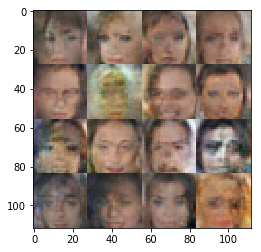

Epoch 0/1... Discriminator Loss: 1.4150... Generator Loss: 5.3366
Epoch 0/1... Discriminator Loss: 0.5891... Generator Loss: 1.8338
Epoch 0/1... Discriminator Loss: 0.8851... Generator Loss: 1.0267
Epoch 0/1... Discriminator Loss: 0.4435... Generator Loss: 2.6906


In [32]:
batch_size = 32
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### 提交项目
提交本项目前，确保运行所有 cells 后保存该文件。

保存该文件为 "dlnd_face_generation.ipynb"， 并另存为 HTML 格式 "File" -> "Download as"。提交项目时请附带 "helper.py" 和 "problem_unittests.py" 文件。